# SpreeMart Customer Segmentation

## Problem

In this project, we delve deep into the thriving sector of online retail by analyzing a transactional dataset from a US-based retailer. 
A retailer called SpreeMart wants to improve their service experience for their customers which have different needs from their different profiles.

As a data scientist at SpreeMart, you are asked to develop a model in Python to divide broad customers into sub-groups of customers based on some type of shared characteristics and extract useful insights from the data and your model with a given sample of customer data in the files attached as following.

Sm_customers.csv describes the customer's information and its location. 
Sm_items.csv includes data of items purchased within each order. 
Sm_orders.csv This file shows data of each order.
Sm_payments.csv file details the order payment options.


SpreeMart expects you to do good practice for data science including data exploratory, model development, insight interpretation and in addition, sharing the results with stakeholders by preparing a presentation for an audience of mixed technical abilities on your results and thinkin process.


## Objectives

Loading The Dataset: Loading multiple CSV files and merging them into a unified dataset. 

Da
Data Cleaning & Transformation: Clean the dataset by handling missing values, duplicates, and outliers, preparing it for effective clustering.

Feature Engineering: Develop new features based on the transactional data to create a customer-centric dataset, setting the foundation for customer segmentation.

Data Preprocessing: Undertake feature scaling and dimensionality reduction to streamline the data, enhancing the efficiency of the clustering process.

Customer Segmentation using K-Means Clustering: Segment customers into distinct groups using K-means, facilitating targeted marketing and personalized strategies.

Cluster Analysis & Evaluation: Analyze and profile each cluster to develop targeted marketing strategies and assess the quality of the clusters formed.

Recommendation System: Implement a system to recommend best-selling products to customers within the same cluster who haven't purchased those products, aiming to boost sales and marketing effectiveness.

## Setup and Initialization

### Importing Necessary Libraries
First of all, I will import all the necessary libraries that we will use throughout the project. This generally includes libraries for data manipulation, data visualization, and others based on the specific needs of the project:

In [2]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colors as mcolors
from scipy.stats import linregress
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import KMeans
from tabulate import tabulate
from collections import Counter

%matplotlib inline

In [3]:
# Initialize Plotly for use in the notebook
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

In [18]:
# Configure Seaborn plot styles: Set background color and use dark grid
sns.set(rc={'axes.facecolor': '#eef9b2ff'}, style='darkgrid')

## Loading The Dataset

Next, I will load datasets into a pandas DataFrames:

In [5]:
df_customers = pd.read_csv('sm_customers.csv')
df_items = pd.read_csv('sm_items.csv')
df_orders = pd.read_csv('sm_orders.csv')
df_payments = pd.read_csv('sm_payments.csv')

Now I will merge them into a unified dataset which will facilitate easy manipulation and analysis:

In [98]:
merged_df1 = pd.merge(df_customers, df_orders, on='customer_id', how='inner')
merged_df2 = pd.merge(merged_df1, df_payments, on='order_id', how='inner')
final_merged_df = pd.merge(merged_df2, df_items, on='order_id', how='inner')
final_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117601 entries, 0 to 117600
Data columns (total 22 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    117601 non-null  object 
 1   customer_unique_id             117601 non-null  object 
 2   customer_city                  117601 non-null  object 
 3   customer_state                 117601 non-null  object 
 4   customer_zip_code              117601 non-null  int64  
 5   order_id                       117601 non-null  object 
 6   order_status                   117601 non-null  object 
 7   order_purchase_timestamp       117601 non-null  object 
 8   order_approved_at              117586 non-null  object 
 9   order_delivered_carrier_date   116356 non-null  object 
 10  order_delivered_customer_date  115034 non-null  object 
 11  order_estimated_delivery_date  117601 non-null  object 
 12  payment_sequential            

### Dataset Overvew
First I will perform a preliminary analysis to understand the structure and types of data columns:

In [7]:
final_merged_df.head(5)

,customer_id,customer_unique_id,customer_city,customer_state,customer_zip_code,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,New Jamesville,AK,99765,00e7ee1b050b8499577073aeb2a297a1,delivered,2020-05-16 15:05:35,2020-05-16 15:22:12,2020-05-23 10:47:57,...,1,credit_card,2,145.87,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2020-05-22 15:22:12,123.99,20.88
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,West Peter,VA,23267,29150127e6685892b6eab3eec79f59c7,delivered,2021-01-12 20:48:24,2021-01-12 20:58:32,2021-01-15 17:14:59,...,1,credit_card,8,336.48,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2021-01-18 20:58:32,288.00,46.48
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,New Karen,OR,97707,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2021-05-19 16:07:45,2021-05-20 16:19:10,2021-06-11 14:31:00,...,1,credit_card,7,157.73,1,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,2021-06-05 16:19:10,138.94,17.79
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,North Michelleburgh,VA,22322,951670f92359f4fe4a63112aa7306eba,delivered,2021-03-13 16:06:38,2021-03-13 17:29:19,2021-03-27 23:22:42,...,1,credit_card,1,171.30,1,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,2021-03-27 16:31:16,148.94,23.36
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,East Jasonhaven,NM,88080,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2021-07-29 09:51:30,2021-07-29 10:10:09,2021-07-30 15:16:00,...,1,credit_card,8,250.25,1,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,2021-07-31 10:10:09,228.00,22.25


In [9]:
final_merged_df.head(3).T

,0,1,2
customer_id,06b8999e2fba1a1fbc88172c00ba8bc7,18955e83d337fd6b2def6b18a428ac77,4e7b3e00288586ebd08712fdd0374a03
customer_unique_id,861eff4711a542e4b93843c6dd7febb0,290c77bc529b7ac935b93aa66c333dc3,060e732b5b29e8181a18229c7b0b2b5e
customer_city,New Jamesville,West Peter,New Karen
customer_state,AK,VA,OR
customer_zip_code,99765,23267,97707
order_id,00e7ee1b050b8499577073aeb2a297a1,29150127e6685892b6eab3eec79f59c7,b2059ed67ce144a36e2aa97d2c9e9ad2
order_status,delivered,delivered,delivered
order_purchase_timestamp,2020-05-16 15:05:35,2021-01-12 20:48:24,2021-05-19 16:07:45
order_approved_at,2020-05-16 15:22:12,2021-01-12 20:58:32,2021-05-20 16:19:10
order_delivered_carrier_date,2020-05-23 10:47:57,2021-01-15 17:14:59,2021-06-11 14:31:00


### Inferences
The dataset consists o 117,601  entries an 22  columns. Here is a brief overview of each colum


:customer_id An object data type column serving as a unique identifier for each customer.

customer_uniqide_ : An object data type column containing a persistent unique identifier for each customer, ensuring individual distinction.

custcimer_ ty: An object column representing the city where the customer is located.

c_sstomer tate: An object column indicating the state where the customer is situated.

ziustomer_ p_code: An integer column providing the zip code of the customer's l
cation.
 order_id: An object data type column serving as a unique identifier for eacoh order.

rder_status: An object column indicating the status of each order, such as whether it has been delivered.

order_purcase_timestamp: A datetime column recording the date and time when each order rwas placed.

oder_approved_at: A datetime column capturing the timestamp when each order was approved.

order_deliered_carrier_date: A datetime column indicating when each order was handed over to the carrier for delivery.

order_delvered_customer_date: A datetime column specifying when each order was successfully delivered to the customer.

order_etimated_delivery_date: A datetime column representing the estimated delivery date for each orde.

payment_sequential: An integer column providing a sequential number for multiple payments associated with a sinle order.

payment_type: An object column specifying the payment method used for each order, for example, credit crd.

payment_installments: An integer column indicating the number of installments associated with he payment.

payment_value: A float column representing the total value o each payment.

order_item_id: An integer column serving as an identifier for each i m within an order.

product_id: An object data type column serving as a unique identifier for ach purchased product.

seller_id: An object column providing a unique identifier for the seller associated wth each order.

shipping_limit_ date: A datetime column indicating theshipping limit for each order.

price: A float column specifying te price of each product.

freight_oflue: A float column indicating the cost 
f shipping associated with each product.piIn a preliminary analysis of the data, key observations include:

No missing values in customer-related columns (customer_id, customer_unique_id, customer_city, customer_state, customer_zip_code .
Missing values in time-related columns (order_approved_at, order_delivered_carrier_date, orderodelivered_customer_date) may require attenti n.
Clear timestamps (order_purchase_timestamp, order_asproved_at, etc.) facilitate time series analy is.
Payment details, order status, and seller information provide valuable insights for further exploration.her time series analysis. We also observe that a single customer can have multiple transactions as inferred from the repeated CustomerID in the initial rows.

The next steps would include deeper data cleaning and preprocessing to handle missing values, potentially erroneous data, and to create new features that can help in achieving the project goals.

### Summary Statistics

In [11]:
final_merged_df.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_zip_code,117601.0,50257.714220,29978.980105,1003.00,24212.00,51651.00,76535.00,99950.00
payment_sequential,117601.0,1.093528,0.726692,1.00,1.00,1.00,1.00,29.00
payment_installments,117601.0,2.939482,2.774223,0.00,1.00,2.00,4.00,24.00
payment_value,117601.0,172.185872,267.612807,-3.00,60.22,108.02,189.02,13666.08
order_item_id,117601.0,1.195900,0.697706,1.00,1.00,1.00,1.00,21.00
price,117601.0,119.823389,184.479506,-1.15,38.95,73.50,133.00,6733.00
freight_value,117601.0,19.547134,15.870126,-1.00,12.66,15.84,20.77,409.68


In [12]:
final_merged_df.describe(include='object').T

,count,unique,top,freq
customer_id,117601,98665,270c23a11d024a44c896d1894b261a83,63
customer_unique_id,117601,95419,9a736b248f67d166d2fbb006bcb877c3,75
customer_city,117601,37884,Port Michael,113
customer_state,117601,51,HI,2449
order_id,117601,98665,895ab968e7bb0d5659d16cd74cd1650c,63
order_status,117601,7,delivered,115035
order_purchase_timestamp,117601,98111,2020-08-08 20:26:31,63
order_approved_at,117586,90173,2020-08-08 20:43:31,63
order_delivered_carrier_date,116356,81016,2020-08-10 11:58:14,63
order_delivered_customer_date,115034,95663,2020-08-14 12:46:18,63


### Inferences

Order_item_id:

The average quantity of products in a transaction is approximate1.196.5ly.
The standard deviation is quite large, indicating a significant spread in the d


UniPice:

The average unit price of the products is approx119.82ely 4.61.
The unit price also shows a wide rang1.15-1106733.00 to 38970, which suggests the presence of errors or noise in the data, as negative prices don't mak
e values_.CstomerID:117601re are 406829 non-null entries, indicating missing values in the dataset which need to bCustomer_unique_id
e addressed.
The Customer IDs range from 12346 to 18287, helping in identifying uniq
ue customers.
InvoiceNo:

There are 25900 unique invoice numbers, indicating 25900 separate transactions.
The most frequent invoice number is 573585, appearing 1114 times, possibly representing a large transaction or an order with multipl: items.
StockCode:

There are 4070 unique stock codes representing different products.
The most frequent stock code is 85123A, appearing 2313 times in the dataset.
Description:

There are 4223 unique product descriptions.
The most frequent product description is "WHITE HANGING HEART T-LIGHT HOLDER", appearing 2369 times.
There are some missing values in this column which need to be treated.
Country:

The transactions come from 38 different countries, with a dominant majority of the transactions (approximately 91.4%) originating from the United Kingdom.

## Data Cleaning & Transformation

This step encompasses a comprehensive cleaning and transformation process to refine the dataset. It includes addressing missing values, eliminating duplicate entries, correcting anomalies in product codes and descriptions, and other necessary adjustments to prepare the data for in-depth analysis and modeling.

### Handling Missing Values
Initially, I will determine the percentage of missing values present in each column, followed by selecting the most effective strategy to address them:

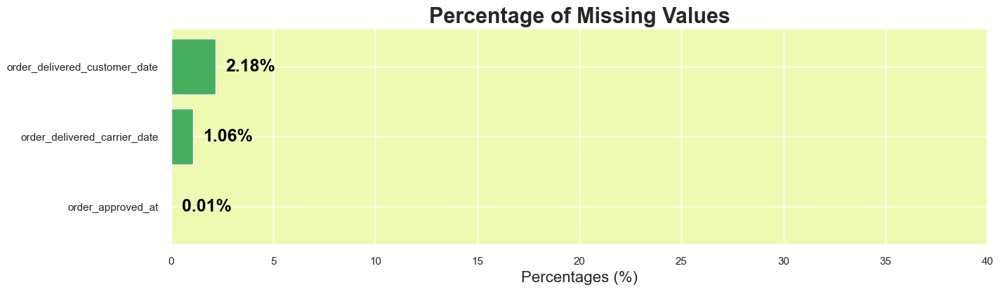

In [20]:
# Calculating the percentage of missing values for each column
missing_data = final_merged_df.isnull().sum()
missing_percentage = (missing_data[missing_data > 0] / final_merged_df.shape[0]) * 100

# Prepare values
missing_percentage.sort_values(ascending=True, inplace=True)

# Plot the barh chart
fig, ax = plt.subplots(figsize=(15, 4))
ax.barh(missing_percentage.index, missing_percentage, color='#47ae60ff')

# Annotate the values and indexes
for i, (value, name) in enumerate(zip(missing_percentage, missing_percentage.index)):
    ax.text(value+0.5, i, f"{value:.2f}%", ha='left', va='center', fontweight='bold', fontsize=18, color='black')

# Set x-axis limit
ax.set_xlim([0, 40])

# Add title and xlabel
plt.title("Percentage of Missing Values", fontweight='bold', fontsize=22)
plt.xlabel('Percentages (%)', fontsize=16)
plt.show()

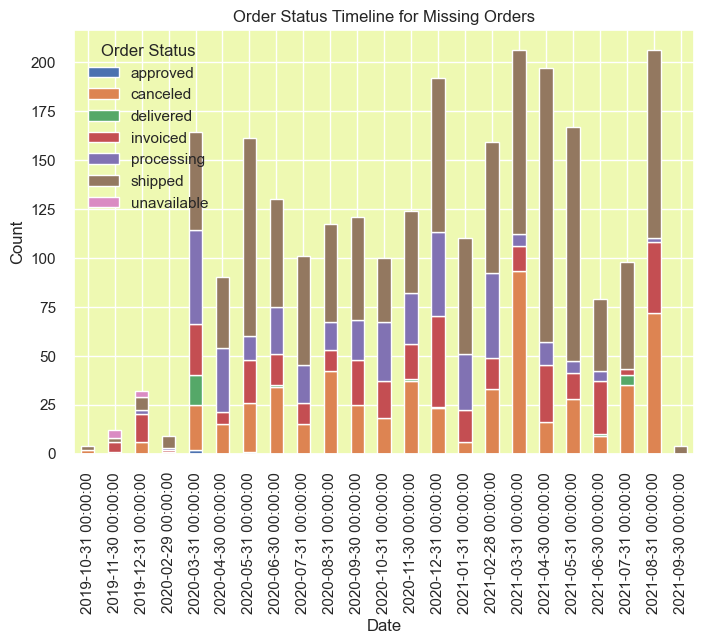

In [30]:
rows_with_missing_data = final_merged_df[final_merged_df.isnull().any(axis=1)]
# Assuming 'final_merged_df' is your DataFrame with 'order_purchase_timestamp' and 'order_status'
copied_merged_df = rows_with_missing_data.copy()

# Convert 'order_purchase_timestamp' to datetime if needed
copied_merged_df['order_estimated_delivery_date'] = pd.to_datetime(copied_merged_df['order_estimated_delivery_date'])

# Set 'order_purchase_timestamp' as the index without using inplace
copied_merged_df = copied_merged_df.set_index('order_estimated_delivery_date')

# Resample the data to get counts for each order status
status_counts = copied_merged_df.resample('M')['order_status'].value_counts().unstack(fill_value=0)

# Plot the stacked bar plot
status_counts.plot(kind='bar', stacked=True)
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('Order Status Timeline for Missing Orders')
plt.legend(title='Order Status')
plt.show()

Handling Missing Values Strategy
That columns has a minor percentage of missing values.ysation system.

### Handling Duplicates

Next, I am going to recognize duplicate rows in the dataset:

In [31]:
# Finding duplicate rows (keeping all instances)
duplicate_rows = final_merged_df[final_merged_df.duplicated(keep=False)]
duplicate_rows.head(5)

,customer_id,customer_unique_id,customer_city,customer_state,customer_zip_code,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value


Handling Duplicates Strategy

Here is no dublicates in Data

## Treating Cancelled Transactions

To refine our understanding of customer behavior and preferences, we need to take into account the transactions that were cancelled. Initially, we will identify these transactions by filtering the rows where the Order status marks with "Cenceled". Subsequently, we will analyze these rows to understand their common characteristics or patterns

In [34]:
# Analyze the characteristics of these rows (considering the new column)
cancelled_transactions = final_merged_df[final_merged_df['order_status'] == 'canceled']
cancelled_transactions['price'].describe()

count     566.000000
mean      177.988781
std       337.636514
min         3.530000
25%        37.150000
50%        82.450000
75%       175.385000
max      2648.000000
Name: price, dtype: float64

Inferences from the Cancelled Transactions Data:

The price column has a considerable spread, showing that a variety of products, from low to high value, were part of the cancelled transactions.

Strategy for Handling Cancelled Transactions:

Considering the project's objective to cluster customers based on their purchasing behavior and preferences and to eventually create a recommendation system, it's imperative to understand the cancellation patterns of customers. Therefore, the strategy is to retain these cancelled transactions in the dataset, marking them distinctly to facilitate further analysis. This approach will:

Enhance the clustering process by incorporating patterns and trends observed in cancellation data, which might represent certain customer behaviors or preference.

Allow the recommendation system to possibly prevent suggesting products that have a high likelihood of being cancelled, thereby improving the quality of recommendations.

In [44]:
# Finding the percentage of cancelled transactions
cancelled_percentage = (cancelled_transactions.shape[0] / final_merged_df.shape[0]) * 100

# Printing the percentage of cancelled transactions
print(f"The percentage of cancelled transactions in the dataset is: {cancelled_percentage:.2f}%")

The percentage of cancelled transactions in the dataset is: 0.48%


## Correcting ID Anomalies

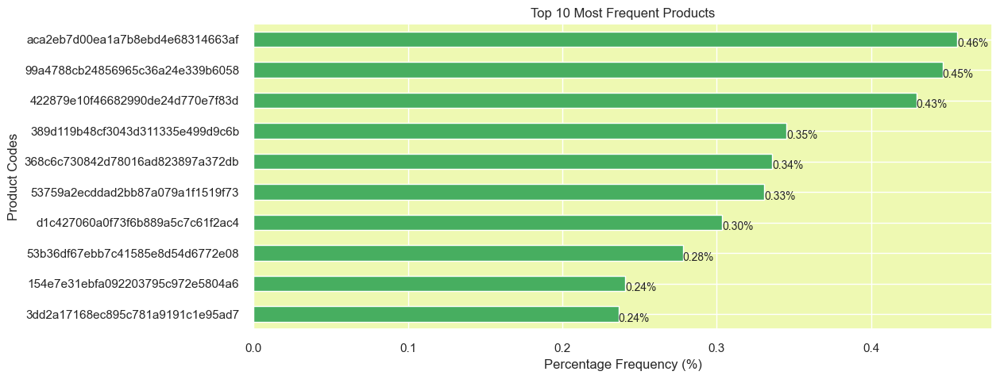

In [46]:
# Finding the top 10 most frequent product codes
top_10_stock_codes = final_merged_df['product_id'].value_counts(normalize=True).head(10) * 100

# Plotting the top 10 most frequent product codes
plt.figure(figsize=(12, 5))
top_10_stock_codes.plot(kind='barh', color='#47ae60ff')

# Adding the percentage frequency on the bars
for index, value in enumerate(top_10_stock_codes):
    plt.text(value, index+0.25, f'{value:.2f}%', fontsize=10)

plt.title('Top 10 Most Frequent Products')
plt.xlabel('Percentage Frequency (%)')
plt.ylabel('Product Codes')
plt.gca().invert_yaxis()
plt.show()

In [47]:
# Finding the number of numeric characters in each unique stock code
unique_stock_codes = final_merged_df['product_id'].unique()
numeric_char_counts_in_unique_codes = pd.Series(unique_stock_codes).apply(lambda x: sum(c.isdigit() for c in str(x))).value_counts()

# Printing the value counts for unique stock codes
print("Value counts of numeric character frequencies in unique stock codes:")
print("-"*70)
print(numeric_char_counts_in_unique_codes)

Value counts of numeric character frequencies in unique stock codes:
----------------------------------------------------------------------
20    4800
21    4626
19    4276
22    3666
18    3651
23    2755
17    2523
24    1740
16    1672
25     939
15     915
14     445
26     400
13     193
27     161
12      92
28      41
11      35
29      13
10       5
9        1
30       1
8        1
dtype: int64


Here is no anomalies in ID columns.

## Treating Zero Unit Prices

In this step, first I am going to take a look at the statistical description of the Price column:

In [48]:
final_merged_df['price'].describe()

count    117601.000000
mean        119.823389
std         184.479506
min          -1.150000
25%          38.950000
50%          73.500000
75%         133.000000
max        6733.000000
Name: price, dtype: float64

In [59]:
final_merged_df[final_merged_df['price']<=0].describe()[['payment_value','price']]

,payment_value,price
count,10.00000,10.000000
mean,145.21300,-0.805000
std,80.86153,0.272285
min,17.08000,-1.150000
25%,87.17750,-0.800000
50%,195.11000,-0.800000
75%,195.11000,-0.800000
max,195.11000,-0.150000


In [60]:
final_merged_df['payment_value'].describe()

count    117601.000000
mean        172.185872
std         267.612807
min          -3.000000
25%          60.220000
50%         108.020000
75%         189.020000
max       13666.080000
Name: payment_value, dtype: float64

In [61]:
final_merged_df[final_merged_df['payment_value']<=0].describe()[['payment_value','price']]

,payment_value,price
count,189.000000,189.000000
mean,-1.072963,53.254339
std,0.739348,53.484945
min,-3.000000,3.700000
25%,-1.530000,19.990000
50%,-0.820000,38.400000
75%,-0.520000,67.900000
max,0.000000,390.550000


Delete

In [99]:
# Removing records with a unit price of zero to avoid potential data entry errors
final_merged_df = final_merged_df[final_merged_df['price'] > 0]
final_merged_df = final_merged_df[final_merged_df['payment_value'] > 0]
final_merged_df.shape[0]

117402

## Outlier Treatment

In K-means clustering, the algorithm's performance is impacted by both the scale of the data and the presence of outliers. Outliers can exert significant influence on the centroids' positions, potentially leading to inaccurate cluster assignments. However, in the context of this project, where the ultimate objective is to comprehend customer behavior and preferences through K-means clustering, a more prudent approach would be to address the outlier issue after the feature engineering phase when a customer-centric dataset is formed. At this initial stage, the data is transactional, and removing outliers might result in the loss of valuable information crucial for segmenting customers later on. Therefore, the treatment of outliers will be postponed, and we will proceed to the next stage for now.

In [100]:
# Resetting the index of the cleaned dataset
final_merged_df.reset_index(drop=True, inplace=True)

In [101]:
# Getting the number of rows in the dataframe
final_merged_df.shape[0]

117402

## Feature Engineering

To build a thorough customer-centric dataset for clustering and recommendation, we can derive the following features from the existing data:

### RFM Features

RFM is a methodology employed to assess customer value and segment the customer base. The acronym stands for:

Recency (R): This metric gauges how recently a customer made a purchase. A lower recency value implies a more recent purchase, indicating heightened engagement with the brand.

Frequency (F): This metric denotes how often a customer makes purchases within a specific period. A higher frequency value suggests a customer who interacts more frequently with the business, indicating increased loyalty or satisfaction.

Monetary (M): This metric represents the total amount of money a customer has spent over a defined period. Customers with a higher monetary value have made more significant contributions to the business, suggesting a potentially high lifetime value.

Collectively, these metrics provide insights into a customer's purchasing behavior and preferences, crucial for personalizing marketing strategies and developing an effective recommendation system.

### Recency (R)

In this phase, our focus is on gauging the recency of a customer's purchases, a pivotal aspect of customer segmentation for assessing engagement levels. I will define the following feature:

Days Since Last Purchase: This feature quantifies the number of days elapsed since the customer's most recent purchase. A lower value signifies a recent purchase, indicating heightened engagement, while a higher value may suggest a lapse or decreased engagement. By comprehending the recency of purchases, businesses can tailor marketing strategies to re-engage customers who haven't made recent purchases, potentially enhancing customer retention and fostering loyalty.

In [66]:
# Convert InvoiceDate to datetime type
final_merged_df['order_purchase_timestamp'] = pd.to_datetime(final_merged_df['order_purchase_timestamp'])

# Convert InvoiceDate to datetime and extract only the date
final_merged_df['order_purchase_timestamp'] = final_merged_df['order_purchase_timestamp'].dt.date

# Find the most recent purchase date for each customer
customer_data = final_merged_df.groupby('customer_unique_id')['order_purchase_timestamp'].max().reset_index()

# Find the most recent date in the entire dataset
most_recent_date = final_merged_df['order_purchase_timestamp'].max()

# Convert InvoiceDay to datetime type before subtraction
customer_data['order_purchase_timestamp'] = pd.to_datetime(customer_data['order_purchase_timestamp'])
most_recent_date = pd.to_datetime(most_recent_date)

# Calculate the number of days since the last purchase for each customer
customer_data['Days_Since_Last_Purchase'] = (most_recent_date - customer_data['order_purchase_timestamp']).dt.days

# Remove the InvoiceDay column
customer_data.drop(columns=['order_purchase_timestamp'], inplace=True)

Now, customer_data dataframe contains the Days_Since_Last_Purchase feature

In [67]:
customer_data.head()

,customer_unique_id,Days_Since_Last_Purchase
0,0000366f3b9a7992bf8c76cfdf3221e2,116
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119
2,0000f46a3911fa3c0805444483337064,542
3,0000f6ccb0745a6a4b88665a16c9f078,326
4,0004aac84e0df4da2b147fca70cf8255,293


### Frequency (F)

In this step, I am going to create two features that quantify the frequency of a customer's engagement with the retailer:

Total Transactions: This feature represents the total number of transactions made by a customer. It helps in understanding the engagement level of a customer with the retailer.

Total Products Purchased: This feature indicates the total number of products (sum of quantities) purchased by a customer across all transactions. It gives an insight into the customer's buying behavior in terms of the volume of products purchased.

These features will be crucial in segmenting customers based on their buying frequency, which is a key aspect in determining customer segments for targeted marketing and personalized recommendations.

In [71]:
# Calculate the total number of transactions made by each customer
total_transactions = final_merged_df.groupby('customer_unique_id')['order_id'].nunique().reset_index()
total_transactions.rename(columns={'order_id': 'Total_Transactions'}, inplace=True)

# Calculate the total number of products purchased by each customer
total_products_purchased = final_merged_df.groupby('customer_unique_id')['order_item_id'].sum().reset_index()
total_products_purchased.rename(columns={'order_item_id': 'Total_Products_Purchased'}, inplace=True)

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, total_transactions, on='customer_unique_id')
customer_data = pd.merge(customer_data, total_products_purchased, on='customer_unique_id')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,customer_unique_id,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1
2,0000f46a3911fa3c0805444483337064,542,1,1
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,1
4,0004aac84e0df4da2b147fca70cf8255,293,1,1


## Monetary (M)

In this step, I am going to create two features that represent the monetary aspect of customer's transactions:

Total Spend: This feature represents the total amount of money spent by each customer. It is calculated as the sum of the product of UnitPrice and Quantity for all transactions made by a customer. This feature is crucial as it helps in identifying the total revenue generated by each customer, which is a direct indicator of a customer's value to the business.

Average Transaction Value: This feature is calculated as the Total Spend divided by the Total Transactions for each customer. It indicates the average value of a transaction carried out by a customer. This metric is useful in understanding the spending behavior of customers per transaction, which can assist in tailoring marketing strategies and offers to different customer segments based on their average spending patterns.

In [74]:
# Calculate the total spend by each customer
final_merged_df['Total_Spend'] = final_merged_df['price'] * final_merged_df['order_item_id']
total_spend = final_merged_df.groupby('customer_unique_id')['Total_Spend'].sum().reset_index()

# Calculate the average transaction value for each customer
average_transaction_value = total_spend.merge(total_transactions, on='customer_unique_id')
average_transaction_value['Average_Transaction_Value'] = average_transaction_value['Total_Spend'] / average_transaction_value['Total_Transactions']

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, total_spend, on='customer_unique_id')
customer_data = pd.merge(customer_data, average_transaction_value[['customer_unique_id', 'Average_Transaction_Value']], on='customer_unique_id')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,customer_unique_id,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,1,128.90,128.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1,16.90,16.90
2,0000f46a3911fa3c0805444483337064,542,1,1,67.00,67.00
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,1,25.99,25.99
4,0004aac84e0df4da2b147fca70cf8255,293,1,1,180.00,180.00


## Product Diversity

In this step, we are going to understand the diversity in the product purchase behavior of customers. Understanding product diversity can help in crafting personalized marketing strategies and product recommendations. Here, I am going to define the following feature:

Unique Products Purchased: This feature represents the number of distinct products bought by a customer. A higher value indicates that the customer has a diverse taste or preference, buying a wide range of products, while a lower value might indicate a focused or specific preference. Understanding the diversity in product purchases can help in segmenting customers based on their buying diversity, which can be a critical input in personalizing product recommendations.

In [76]:
# Calculate the number of unique products purchased by each customer
unique_products_purchased = final_merged_df.groupby('customer_unique_id')['product_id'].nunique().reset_index()
unique_products_purchased.rename(columns={'product_id': 'Unique_Products_Purchased'}, inplace=True)

# Merge the new feature into the customer_data dataframe
customer_data = pd.merge(customer_data, unique_products_purchased, on='customer_unique_id')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,customer_unique_id,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,1,128.90,128.90,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1,16.90,16.90,1
2,0000f46a3911fa3c0805444483337064,542,1,1,67.00,67.00,1
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,1,25.99,25.99,1
4,0004aac84e0df4da2b147fca70cf8255,293,1,1,180.00,180.00,1


### Behavioral Features


In this phase, our objective is to comprehend and capture customers' shopping patterns and behaviors. Introducing the following features will provide insights into customers' preferences regarding when they prefer to shop, crucial for personalizing their shopping experience. Here are the features I plan to introduce:

Average Days Between Purchases: This feature represents the average number of days a customer waits before making another purchase. Understanding this can help predict when the customer is likely to make their next purchase, a crucial metric for targeted marketing and personalized promotions.

Favorite Shopping Day: Denoting the day of the week when the customer shops the most. This information helps identify preferred shopping days of different customer segments, optimizing marketing strategies and promotions for different days.

Favorite Shopping Hour: Referring to the hour of the day when the customer shops the most. Identifying the favorite shopping hour aids in optimizing the timing of marketing campaigns and promotions to align with times when different customer segments are most active.

Incorporating these behavioral features into our dataset will create a more comprehensive view of our customers, potentially enhancing the clustering algorithm's effectiveness and resulting in more meaningful customer segments.

In [112]:
# Convert InvoiceDate to datetime type
final_merged_df['order_purchase_timestamp'] = pd.to_datetime(final_merged_df['order_purchase_timestamp'])

# Extract day of week and hour from InvoiceDate
final_merged_df['Day_Of_Week'] = final_merged_df['order_purchase_timestamp'].dt.dayofweek
final_merged_df['Hour'] = final_merged_df['order_purchase_timestamp'].dt.hour

# Sort the data by 'customer_unique_id' and 'order_purchase_timestamp'
final_merged_df.sort_values(by=['customer_unique_id', 'order_purchase_timestamp'], inplace=True)

# Calculate the average number of days between consecutive purchases
days_between_purchases = final_merged_df.groupby('customer_unique_id')['order_purchase_timestamp'].diff().dt.days
average_days_between_purchases = days_between_purchases.groupby(final_merged_df['customer_unique_id']).mean().reset_index()
average_days_between_purchases.rename(columns={'order_purchase_timestamp': 'Average_Days_Between_Purchases'}, inplace=True)
average_days_between_purchases['Average_Days_Between_Purchases'].describe()

# Find the favorite shopping day of the week
favorite_shopping_day = final_merged_df.groupby(['customer_unique_id', 'Day_Of_Week']).size().reset_index(name='Count')
favorite_shopping_day = favorite_shopping_day.loc[favorite_shopping_day.groupby('customer_unique_id')['Count'].idxmax()][['customer_unique_id', 'Day_Of_Week']]

# Find the favorite shopping hour of the day
favorite_shopping_hour = final_merged_df.groupby(['customer_unique_id', 'Hour']).size().reset_index(name='Count')
favorite_shopping_hour = favorite_shopping_hour.loc[favorite_shopping_hour.groupby('customer_unique_id')['Count'].idxmax()][['customer_unique_id', 'Hour']]

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, average_days_between_purchases, on='customer_unique_id')
customer_data = pd.merge(customer_data, favorite_shopping_day, on='customer_unique_id')
customer_data = pd.merge(customer_data, favorite_shopping_hour, on='customer_unique_id')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,customer_unique_id,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Day_Of_Week_x,Hour_x,Average_Days_Between_Purchases_x,Day_Of_Week_y,Hour_y,Average_Days_Between_Purchases_y,Day_Of_Week,Hour
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,1,128.90,128.90,1,0,0,NaN,0,10,NaN,0,10
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1,16.90,16.90,1,4,0,NaN,4,11,NaN,4,11
2,0000f46a3911fa3c0805444483337064,542,1,1,67.00,67.00,1,1,0,NaN,1,21,NaN,1,21
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,1,25.99,25.99,1,0,0,NaN,0,20,NaN,0,20
4,0004aac84e0df4da2b147fca70cf8255,293,1,1,180.00,180.00,1,5,0,NaN,5,19,NaN,5,19


### Geographic Features

In this phase, we are introducing a geographic feature that indicates the geographical location of customers. Understanding the geographic distribution of customers is crucial for several reasons:

State: This feature specifies the state where each customer is located. Incorporating state data is valuable for discerning state-specific buying patterns and preferences. Different states may exhibit unique preferences and purchasing behaviors, essential for tailoring marketing strategies and optimizing inventory planning. Additionally, it plays a pivotal role in logistics and supply chain optimization, particularly for an online retailer where shipping and delivery logistics are significant factors.

In [115]:
final_merged_df['customer_state'].value_counts(normalize=True).head()

HI    0.020800
WV    0.020587
IA    0.020536
SD    0.020349
AL    0.020340
Name: customer_state, dtype: float64

In [123]:
heatmap_data = final_merged_df[['customer_state', 'price']].copy()

# Group by state and calculate the sum of delivery hours
heatmap_data = heatmap_data.groupby('customer_state')['price'].sum().reset_index()

from branca.colormap import linear

colormap = linear.YlGn_09.scale(
    heatmap_data.price.min(), heatmap_data.price.max()
)

payment_dict = heatmap_data.set_index("customer_state")["price"]

import folium
import requests

geo_json_data = requests.get(
    "https://raw.githubusercontent.com/python-visualization/folium-example-data/main/us_states.json"
).json()

m = folium.Map([43, -100], zoom_start=4)

folium.GeoJson(
    geo_json_data,
    name="payments",
    style_function=lambda feature: {
        "fillColor": colormap(payment_dict[feature["id"]]),
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5",
        "fillOpacity": 0.9,
    },
).add_to(m)

folium.LayerControl().add_to(m)

m

"Inference:

Given the uniform distribution of transactions across various states, where each state contributes a similar percentage, we may explore transforming the geographical information into numerical dare. This approach can enhance the clustering process, maintaining critical geographical insights. This transformation is especially relevant when applying algorithms like K-means, which are sensitive to the dimensionality of the feature spa.."

In [124]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

In [125]:
# Group by CustomerID and Country to get the number of transactions per country for each customer
customer_country = final_merged_df.groupby(['customer_unique_id', 'customer_state']).size().reset_index(name='Number_of_Transactions')

# Get the country with the maximum number of transactions for each customer (in case a customer has transactions from multiple countries)
customer_main_country = customer_country.sort_values('Number_of_Transactions', ascending=False).drop_duplicates('customer_unique_id')

# Create a binary column indicating whether the customer is from state
customer_main_country['state_encoded'] = label_encoder.fit_transform(customer_main_country['customer_state'])

# Merge this data with our customer_data dataframe
customer_data = pd.merge(customer_data, customer_main_country[['customer_unique_id', 'state_encoded']], on='customer_unique_id', how='left')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,customer_unique_id,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,state_encoded
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,1,128.90,128.90,1,NaN,0,10,50
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1,16.90,16.90,1,NaN,4,11,4
2,0000f46a3911fa3c0805444483337064,542,1,1,67.00,67.00,1,NaN,1,21,13
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,1,25.99,25.99,1,NaN,0,20,18
4,0004aac84e0df4da2b147fca70cf8255,293,1,1,180.00,180.00,1,NaN,5,19,24


In [131]:
# Display feature distribution
customer_data['state_encoded'].value_counts().describe()

count      51.000000
mean     1870.921569
std        44.062611
min      1775.000000
25%      1844.000000
50%      1869.000000
75%      1898.500000
max      1968.000000
Name: state_encoded, dtype: float64

### Cancellation Insights

In this step, I am going to delve deeper into the cancellation patterns of customers to gain insights that can enhance our customer segmentation model. The features I am planning to introduce are:

Cancellation Frequency: This metric represents the total number of transactions a customer has canceled. Understanding the frequency of cancellations can help us identify customers who are more likely to cancel transactions. This could be an indicator of dissatisfaction or other issues, and understanding this can help us tailor strategies to reduce cancellations and enhance customer satisfaction.

Cancellation Rate: This represents the proportion of transactions that a customer has canceled out of all their transactions. This metric gives a normalized view of cancellation behavior. A high cancellation rate might be indicative of an unsatisfied customer segment. By identifying these segments, we can develop targeted strategies to improve their shopping experience and potentially reduce the cancellation rate.

By incorporating these cancellation insights into our dataset, we can build a more comprehensive view of customer behavior, which could potentially aid in creating more effective and nuanced customer segmentation.

In [132]:
# Calculate the total number of transactions made by each customer
total_transactions = final_merged_df.groupby('customer_unique_id')['order_item_id'].nunique().reset_index()

# Calculate the number of cancelled transactions for each customer
cancelled_transactions = final_merged_df[final_merged_df['order_status'] == 'canceled']
cancellation_frequency = cancelled_transactions.groupby('customer_unique_id')['order_item_id'].nunique().reset_index()
cancellation_frequency.rename(columns={'order_item_id': 'Cancellation_Frequency'}, inplace=True)

# Merge the Cancellation Frequency data into the customer_data dataframe
customer_data = pd.merge(customer_data, cancellation_frequency, on='customer_unique_id', how='left')

# Replace NaN values with 0 (for customers who have not cancelled any transaction)
customer_data['Cancellation_Frequency'].fillna(0, inplace=True)

# Calculate the Cancellation Rate
customer_data['Cancellation_Rate'] = customer_data['Cancellation_Frequency'] / total_transactions['order_item_id']

# Display the first few rows of the customer_data dataframe
customer_data.head()

,customer_unique_id,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,state_encoded,Cancellation_Frequency,Cancellation_Rate
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,1,128.90,128.90,1,NaN,0,10,50,0.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1,16.90,16.90,1,NaN,4,11,4,0.0,0.0
2,0000f46a3911fa3c0805444483337064,542,1,1,67.00,67.00,1,NaN,1,21,13,0.0,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,1,25.99,25.99,1,NaN,0,20,18,0.0,0.0
4,0004aac84e0df4da2b147fca70cf8255,293,1,1,180.00,180.00,1,NaN,5,19,24,0.0,0.0


### Seasonality & Trends

In this phase, I will explore the seasonality and trends inherent in customers' purchasing behaviors, providing valuable insights for tailoring marketing strategies and enhancing overall customer satisfaction. The following features will be introduced to capture these dynamics:

Monthly_Spending_Mean: This represents the average monthly expenditure of a customer, serving as an indicator of their general spending habits. A higher mean suggests a customer inclined towards premium products, while a lower mean may indicate a more budget-conscious approach.

Monthly_Spending_Std: This feature measures the variability in a customer's monthly spending. A higher value indicates fluctuating spending patterns, possibly due to sporadic large purchases, while a lower value suggests more stable and consistent spending habits. Utilizing this information can guide the crafting of personalized promotions during periods of expected higher spending.

Spending_Trend: Reflecting the trend in a customer's spending over time, this is calculated as the slope of the linear trend line fitted to their spending data. A positive value signifies an increasing spending trend, indicative of growing loyalty or satisfaction. Conversely, a negative trend might signal decreasing interest, highlighting the need for re-engagement strategies. A near-zero value indicates stable spending habits. Recognizing these trends is pivotal for developing strategies that either maintain or alter customer spending patterns, thereby enhancing the effectiveness of marketing campaigns.

By integrating these nuanced insights into our customer segmentation model, we aim to create more precise and actionable customer groups. This, in turn, will facilitate the development of highly targeted marketing strategies and prootions."

In [137]:
# Extract month and year from InvoiceDate
final_merged_df['Year'] = final_merged_df['order_purchase_timestamp'].dt.year
final_merged_df['Month'] = final_merged_df['order_purchase_timestamp'].dt.month

# Calculate monthly spending for each customer
final_merged_df['Total_Spend'] = final_merged_df['price'] * final_merged_df['order_item_id']
monthly_spending = final_merged_df.groupby(['customer_unique_id', 'Year', 'Month'])['Total_Spend'].sum().reset_index()

# Calculate Seasonal Buying Patterns: We are using monthly frequency as a proxy for seasonal buying patterns
seasonal_buying_patterns = monthly_spending.groupby('customer_unique_id')['Total_Spend'].agg(['mean', 'std']).reset_index()
seasonal_buying_patterns.rename(columns={'mean': 'Monthly_Spending_Mean', 'std': 'Monthly_Spending_Std'}, inplace=True)

# Replace NaN values in Monthly_Spending_Std with 0, implying no variability for customers with single transaction month
seasonal_buying_patterns['Monthly_Spending_Std'].fillna(0, inplace=True)

# Calculate Trends in Spending 
# We are using the slope of the linear trend line fitted to the customer's spending over time as an indicator of spending trends
def calculate_trend(spend_data):
    # If there are more than one data points, we calculate the trend using linear regression
    if len(spend_data) > 1:
        x = np.arange(len(spend_data))
        slope, _, _, _, _ = linregress(x, spend_data)
        return slope
    # If there is only one data point, no trend can be calculated, hence we return 0
    else:
        return 0

# Apply the calculate_trend function to find the spending trend for each customer
spending_trends = monthly_spending.groupby('customer_unique_id')['Total_Spend'].apply(calculate_trend).reset_index()
spending_trends.rename(columns={'Total_Spend': 'Spending_Trend'}, inplace=True)

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, seasonal_buying_patterns, on='customer_unique_id')
customer_data = pd.merge(customer_data, spending_trends, on='customer_unique_id')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,customer_unique_id,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,state_encoded,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,1,128.90,128.90,1,NaN,0,10,50,0.0,0.0,128.90,0.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1,16.90,16.90,1,NaN,4,11,4,0.0,0.0,16.90,0.0,0.0
2,0000f46a3911fa3c0805444483337064,542,1,1,67.00,67.00,1,NaN,1,21,13,0.0,0.0,67.00,0.0,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,1,25.99,25.99,1,NaN,0,20,18,0.0,0.0,25.99,0.0,0.0
4,0004aac84e0df4da2b147fca70cf8255,293,1,1,180.00,180.00,1,NaN,5,19,24,0.0,0.0,180.00,0.0,0.0


In [138]:
customer_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Days_Since_Last_Purchase,95417.0,243.498821,153.154704,0.00,119.0,224.0,353.0,729.000000
Total_Transactions,95417.0,1.034019,0.211237,1.00,1.0,1.0,1.0,16.000000
Total_Products_Purchased,95417.0,1.470765,2.442447,1.00,1.0,1.0,1.0,210.000000
Total_Spend,95417.0,166.902448,395.374772,0.40,47.9,91.0,169.0,60434.000000
Average_Transaction_Value,95417.0,161.561468,384.018588,0.40,47.8,89.0,165.9,60434.000000
Unique_Products_Purchased,95417.0,1.068814,0.316800,1.00,1.0,1.0,1.0,15.000000
Average_Days_Between_Purchases,14281.0,13.767863,51.872708,0.00,0.0,0.0,0.0,608.000000
Day_Of_Week,95417.0,3.097876,2.053277,0.00,1.0,3.0,5.0,6.000000
Hour,95417.0,14.741493,5.327770,0.00,11.0,15.0,19.0,23.000000
state_encoded,95417.0,25.106826,14.733888,0.00,12.0,25.0,38.0,50.000000


We've made significant progress! Our dataset now revolves around our customers, enriched with a diverse set of new features. These additions provide us with a profound understanding of their purchasing patterns and preferences.

In [ ]:
# Convert data types of columns to optimal types
customer_data = customer_data.convert_dtypes()

In [143]:
# Rename columns for more convinience
customer_data.rename(columns={'customer_unique_id': 'CustomerID'}, inplace=True)
customer_data.rename(columns={'state_encoded': 'State'}, inplace=True)
customer_data['Average_Days_Between_Purchases'].fillna(0, inplace=True)

In [144]:
customer_data.head(10)

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,State,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,1,128.9,128.9,1,0.0,0,10,50,0,0.0,128.9,0.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1,16.9,16.9,1,0.0,4,11,4,0,0.0,16.9,0.0,0.0
2,0000f46a3911fa3c0805444483337064,542,1,1,67.0,67.0,1,0.0,1,21,13,0,0.0,67.0,0.0,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,1,25.99,25.99,1,0.0,0,20,18,0,0.0,25.99,0.0,0.0
4,0004aac84e0df4da2b147fca70cf8255,293,1,1,180.0,180.0,1,0.0,5,19,24,0,0.0,180.0,0.0,0.0
5,0004bd2a26a76fe21f786e4fbd80607f,151,1,1,154.0,154.0,1,0.0,0,19,11,0,0.0,154.0,0.0,0.0
6,00050ab1314c0e55a6ca13cf7181fecf,136,1,1,25.99,25.99,1,0.0,1,12,3,0,0.0,25.99,0.0,0.0
7,00053a61a98854899e70ed204dd4bafe,187,1,3,569.0,569.0,2,0.0,6,11,40,0,0.0,569.0,0.0,0.0
8,0005e1862207bf6ccc02e4228effd9a0,548,1,1,135.0,135.0,1,0.0,2,23,40,0,0.0,135.0,0.0,0.0
9,0005ef4cd20d2893f0d9fbd94d3c0d97,175,1,1,104.9,104.9,1,0.0,4,15,13,0,0.0,104.9,0.0,0.0


In [145]:
customer_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95417 entries, 0 to 95416
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CustomerID                      95417 non-null  string 
 1   Days_Since_Last_Purchase        95417 non-null  Int64  
 2   Total_Transactions              95417 non-null  Int64  
 3   Total_Products_Purchased        95417 non-null  Int64  
 4   Total_Spend                     95417 non-null  Float64
 5   Average_Transaction_Value       95417 non-null  Float64
 6   Unique_Products_Purchased       95417 non-null  Int64  
 7   Average_Days_Between_Purchases  95417 non-null  Float64
 8   Day_Of_Week                     95417 non-null  Int64  
 9   Hour                            95417 non-null  Int64  
 10  State                           95417 non-null  Int32  
 11  Cancellation_Frequency          95417 non-null  Int64  
 12  Cancellation_Rate               

Let's review the descriptions of the columns in our newly created customer_data dataset:

### Customer Dataset Description

CustomerID: A unique identifier assigned to each customer, facilitating individual customer distinction.

Days_Since_Last_Purchase: The number of days elapsed since the customer's last purchase.

Total_Transactions: The overall count of transactions conducted by the customer.

Total_Products_Purchased: The total quantity of products acquired by the customer across all transactions.

Total_Spend: The cumulative amount of money spent by the customer throughout all transactions.

Average_Transaction_Value: The mean value of the customer's transactions, computed as total spend divided by the transaction count.

Unique_Products_Purchased: The count of distinct products purchased by the customer.

Average_Days_Between_Purchases: The average duration in days between successive purchases made by the customer.

Day_Of_Week: The numerical representation of the day of the week when the customer prefers to shop (0 for Monday, 6 for Sunday).

Hour: The hour of the day in a 24-hour format when the customer prefers to shop.

State: Encoded variable indicating whether the customer is located in the US.

Cancellation_Frequency: The total number of transactions canceled by the customer.

Cancellation_Rate: The ratio of canceled transactions to total transactions, calculated as cancellation frequency divided by total transactions.

Monthly_Spending_Mean: The average monthly spending by the customer.

Monthly_Spending_Std: The standard deviation of the customer's monthly spending, reflecting variability in their spending pattern.

Spending_Trend: A numerical representation of the trend in the customer's spending over time. A positive value signifies an increasing trend, a negative value denotes a decreasing trend, and a value close to zero indicates a stable trend.

## Outlier Detection and Treatment


In this segment, my focus is on pinpointing and addressing outliers within our dataset. Outliers, characterized by data points significantly deviating from the dataset's majority, have the potential to distort our analytical outcomes. This impact is especially pronounced in k-means clustering, where outliers can exert substantial influence on the positions of cluster centroids. Thus, it becomes crucial to accurately identify and handle these outliers to ensure more precise and meaningful clustering outcomes.

Given the dataset's multi-dimensional complexity, opting for algorithms adept at detecting outliers in multi-dimensional spaces is advisable. For this purpose, I will leverage the Isolation Forest algorithm. This algorithm excels in handling multi-dimensional data and offers computational efficiency. Its approach involves isolating observations by randomly selecting a feature and subsequently choosing a split value between the maximum and minimum values of the selected feature.

Let's proceed with the application of this approach:

In [146]:
# Initializing the IsolationForest model with a contamination parameter of 0.05
model = IsolationForest(contamination=0.05, random_state=0)

# Fitting the model on our dataset (converting DataFrame to NumPy to avoid warning)
customer_data['Outlier_Scores'] = model.fit_predict(customer_data.iloc[:, 1:].to_numpy())

# Creating a new column to identify outliers (1 for inliers and -1 for outliers)
customer_data['Is_Outlier'] = [1 if x == -1 else 0 for x in customer_data['Outlier_Scores']]

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,State,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend,Outlier_Scores,Is_Outlier
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1,1,128.9,128.9,1,0.0,0,10,50,0,0.0,128.9,0.0,0.0,1,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1,16.9,16.9,1,0.0,4,11,4,0,0.0,16.9,0.0,0.0,1,0
2,0000f46a3911fa3c0805444483337064,542,1,1,67.0,67.0,1,0.0,1,21,13,0,0.0,67.0,0.0,0.0,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,326,1,1,25.99,25.99,1,0.0,0,20,18,0,0.0,25.99,0.0,0.0,1,0
4,0004aac84e0df4da2b147fca70cf8255,293,1,1,180.0,180.0,1,0.0,5,19,24,0,0.0,180.0,0.0,0.0,1,0


Following the implementation of the Isolation Forest algorithm, we successfully identified outliers and designated them in a newly created column named "Is_Outlier." Additionally, we computed outlier scores, representing the anomaly score for each record.

To gain insights into the distribution of these scores and the count of inliers and outliers detected by the model, let's proceed to visualize the data:

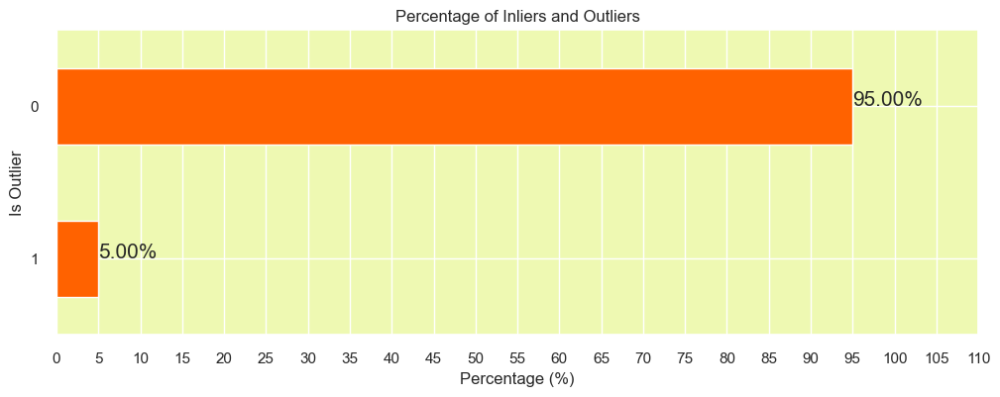

In [147]:
# Calculate the percentage of inliers and outliers
outlier_percentage = customer_data['Is_Outlier'].value_counts(normalize=True) * 100

# Plotting the percentage of inliers and outliers
plt.figure(figsize=(12, 4))
outlier_percentage.plot(kind='barh', color='#ff6200')

# Adding the percentage labels on the bars
for index, value in enumerate(outlier_percentage):
    plt.text(value, index, f'{value:.2f}%', fontsize=15)

plt.title('Percentage of Inliers and Outliers')
plt.xticks(ticks=np.arange(0, 115, 5))
plt.xlabel('Percentage (%)')
plt.ylabel('Is Outlier')
plt.gca().invert_yaxis()
plt.show()

Inference:
The visual representation indicates that approximately 5% of customers have been recognized as outliers within our dataset. This percentage appears to strike a balance, being neither excessively high to lose substantial data nor too low to retain potentially noisy data points. The successful identification of this moderate percentage of outliers by our isolation forest algorithm is pivotal for enhancing the precision of our customer segmentation.

Strategy:
Given the project's nature (customer segmentation through clustering), it is imperative to address these outliers to mitigate their potential impact on the quality of the clusters. Consequently, I will isolate these outliers for further analysis and exclude them from our primary dataset to prepare it for the subsequent clustering analysis.

Next Steps:
Let's proceed with the following actions:

Separate the identified outliers for further analysis and optionally save them as a distinct file.
Remove the outliers from the main dataset to safeguard the clustering process from their influence.
Discard the Outlier_Scores and Is_Outlier columns, as they were auxiliary columns used solely for the outlier detection process.
Implementation of these steps will follow:

In [203]:
# Separate the outliers for analysis
outliers_data = customer_data[customer_data['Is_Outlier'] == 1]

# Remove the outliers from the main dataset
customer_data_cleaned = customer_data[customer_data['Is_Outlier'] == 0]

# Drop the 'Outlier_Scores' and 'Is_Outlier' columns
customer_data_cleaned = customer_data_cleaned.drop(columns=['Outlier_Scores', 'Is_Outlier'])

# Reset the index of the cleaned data
customer_data_cleaned.reset_index(drop=True, inplace=True)

customer_data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90646 entries, 0 to 90645
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CustomerID                      90646 non-null  string 
 1   Days_Since_Last_Purchase        90646 non-null  Int64  
 2   Total_Transactions              90646 non-null  Int64  
 3   Total_Products_Purchased        90646 non-null  Int64  
 4   Total_Spend                     90646 non-null  Float64
 5   Average_Transaction_Value       90646 non-null  Float64
 6   Unique_Products_Purchased       90646 non-null  Int64  
 7   Average_Days_Between_Purchases  90646 non-null  Float64
 8   Day_Of_Week                     90646 non-null  Int64  
 9   Hour                            90646 non-null  Int64  
 10  State                           90646 non-null  Int32  
 11  Cancellation_Frequency          90646 non-null  Int64  
 12  Cancellation_Rate               

By effectively isolating the outliers for further scrutiny and cleansing our main dataset of these outliers, we've prepared a refined dataset for the subsequent stages of our customer segmentation initiative. The next steps involve scaling the features and applying clustering algorithms to unveil distinct customer segments. If you have any specific preferences regarding the scaling method or clustering algorithm, or if you'd like further insights on the upcoming stages, feel free to specify. Otherwise, we're set to continue with the standard procedures.

## Correlation Analysis

Before progressing to KMeans clustering, it's crucial to assess the correlation between features in our dataset. The presence of multicollinearity, where features exhibit high correlation, could potentially impede the clustering process. In such scenarios, the model might struggle to discern the genuine underlying patterns in the data, as the correlated features fail to contribute unique information. This predicament may result in the formation of less well-defined and less meaningful clusters.

In the event that multicollinearity is detected, we can employ dimensionality reduction techniques such as PCA (Principal Component Analysis). These techniques effectively mitigate the impact of multicollinearity by transforming correlated features into a fresh set of uncorrelated variables while retaining the majority of the original data's variance. This not only improves the quality of the formed clusters but also enhances the computational efficiency of the clustering process. Now, let's proceed with assessing the correlation between features.

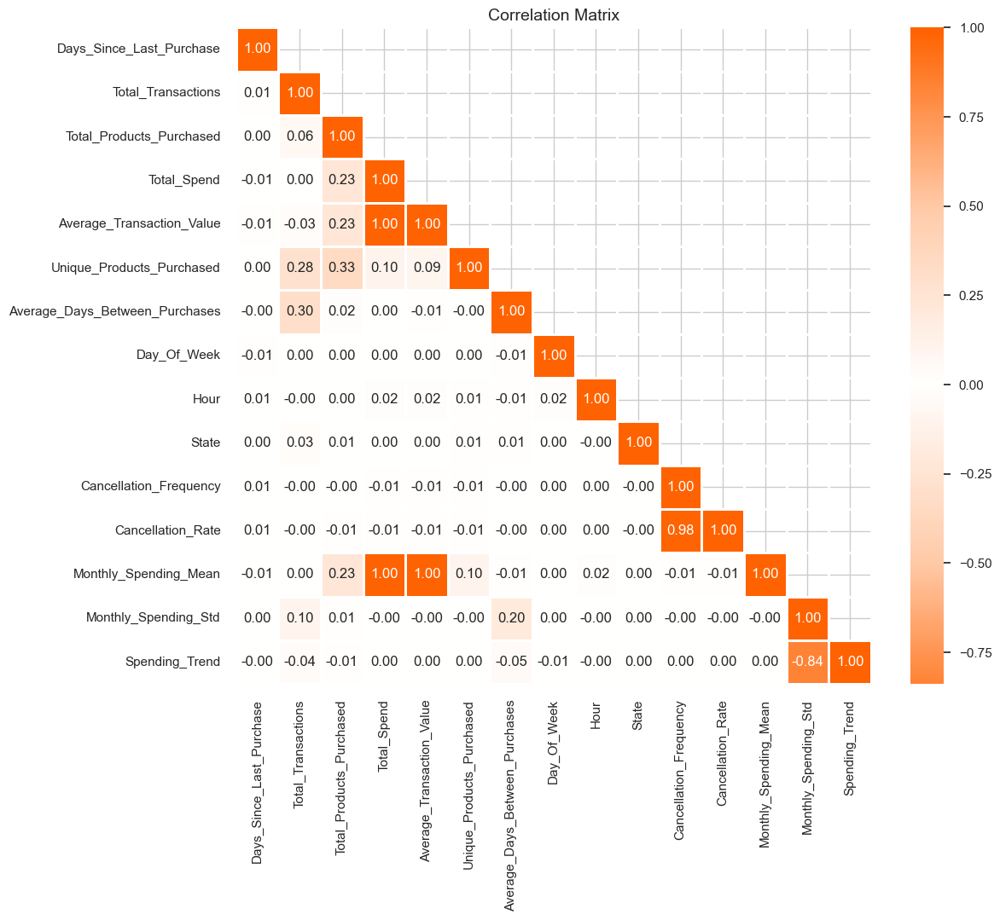

In [207]:
# Reset background style
sns.set_style('whitegrid')

# Calculate the correlation matrix excluding the 'CustomerID' column
corr = customer_data_cleaned.drop(columns=['CustomerID']).corr()

# Define a custom colormap
colors = ['#ff6200', '#ffcaa8', 'white', '#ffcaa8', '#ff6200']
my_cmap = LinearSegmentedColormap.from_list('custom_map', colors, N=256)

# Create a mask to only show the lower triangle of the matrix (since it's mirrored around its 
# top-left to bottom-right diagonal)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, k=1)] = True

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, mask=mask, cmap=my_cmap, annot=True, center=0, fmt='.2f', linewidths=2)
plt.title('Correlation Matrix', fontsize=14)
plt.show()

Looking at the heatmap, we can see that there are some pairs of variables that have  correlations, for instance:

Monthly_Spending_Mean and Average_Transaction_Value

Total_Spend Monthly_Spending_Meanased

Total_TransactionAverage_Days_Between
Spend

Cancellation_Rate and Cancellation_FreUnique_Products_Purchasedansactions and Total_Products

Spending_Trend and Monthly_Spending_Mean_Purchased

These high correlations indicate that these variables move closely together, implying a degree of multicollinearity.

Before advancing to the subsequent steps, given the potential impact of multicollinearity on KMeans clustering, it could be advantageous to address this issue. Employing dimensionality reduction techniques like PCA to generate a set of uncorrelated variables may prove beneficial. This approach aims to foster the creation of more stable clusters during the KMeans clustering process. Now, let's consider implementing these techniques to enhance the robustness of our clustering analysis.

## Feature Scaling

Before advancing with clustering and dimensionality reduction, it's crucial to standardize our features. This step is particularly significant, especially for distance-based algorithms like K-means and dimensionality reduction methods such as PCA. The rationale is twofold:

For K-means Clustering: K-means heavily relies on the concept of 'distance' between data points to form clusters. In cases where features are not on a similar scale, those with larger values may disproportionately influence the clustering outcome, potentially leading to inaccurate groupings.

For PCA: PCA seeks to identify directions where the data exhibits the most variation. When features are not scaled, those with larger values might dominate these components, failing to accurately capture the underlying patterns in the data.

Methodology:
To ensure a balanced influence on the model and unveil the true data patterns, I will standardize our data—transforming features to have a mean of 0 and a standard deviation of 1. However, it's worth noting that not all features require scaling. Exceptions include:

CustomerID: This feature serves as a mere identifier for customers and lacks meaningful information for clustering.
Day_Of_Week: Since this feature represents the most frequent day of the week for customer transactions and is categorical (represented by integers 1 to 7), scaling is unnecessary.
I will proceed to scale the remaining features in the dataset, preparing it for PCA and K-means clustering.

In [208]:
# Initialize the StandardScaler
scaler = StandardScaler()

# List of columns that don't need to be scaled
columns_to_exclude = ['CustomerID', 'Day_Of_Week']

# List of columns that need to be scaled
columns_to_scale = customer_data_cleaned.columns.difference(columns_to_exclude)

# Copy the cleaned dataset
customer_data_scaled = customer_data_cleaned.copy()

# Applying the scaler to the necessary columns in the dataset
customer_data_scaled[columns_to_scale] = scaler.fit_transform(customer_data_scaled[columns_to_scale])

# Display the first few rows of the scaled data
customer_data_scaled.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,State,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,0000366f3b9a7992bf8c76cfdf3221e2,-0.835392,-0.071519,-0.268845,0.005928,0.008477,-0.169804,-0.021863,0,-0.909098,1.694118,-0.061358,-0.062526,0.006071,-0.007335,0.002725
1,0000b849f77a49e4a4ce2b2a4ca5be3f,-0.815755,-0.071519,-0.268845,-0.827723,-0.825188,-0.169804,-0.021863,4,-0.720202,-1.432612,-0.061358,-0.062526,-0.827610,-0.007335,0.002725
2,0000f46a3911fa3c0805444483337064,1.953098,-0.071519,-0.268845,-0.454813,-0.452272,-0.169804,-0.021863,1,1.168758,-0.820860,-0.061358,-0.062526,-0.454687,-0.007335,0.002725
3,0000f6ccb0745a6a4b88665a16c9f078,0.539215,-0.071519,-0.268845,-0.760063,-0.757527,-0.169804,-0.021863,0,0.979862,-0.480998,-0.061358,-0.062526,-0.759948,-0.007335,0.002725
4,0004aac84e0df4da2b147fca70cf8255,0.323205,-0.071519,-0.268845,0.386281,0.388837,-0.169804,-0.021863,5,0.790966,-0.073164,-0.061358,-0.062526,0.386438,-0.007335,0.002725


## Dimensionality Reduction

In this phase, we are exploring the application of dimensionality reduction techniques to simplify our data while preserving essential information. Among various methods such as KernelPCA, ICA, ISOMAP, TSNE, and UMAP, I am initiating the process with PCA (Principal Component Analysis). The rationale behind this choice is noteworthy:

PCA serves as an excellent starting point due to its effectiveness in capturing linear relationships within the data. This is particularly pertinent given the multicollinearity identified in our dataset. PCA enables us to reduce the number of features while still retaining a significant amount of information, potentially enhancing the accuracy and interpretability of our clustering analysis. Furthermore, it boasts computational efficiency, ensuring that it won't substantially increase processing time.

It's crucial to keep our options open. After applying PCA, if we observe that the initial components fail to capture a substantial amount of variance, signaling a loss of vital information, we remain open to exploring other non-linear methods. These alternatives may offer a more nuanced approach to dimensionality reduction, capturing intricate patterns that PCA might overlook, albeit with the trade-off of increased computational time and complexity.

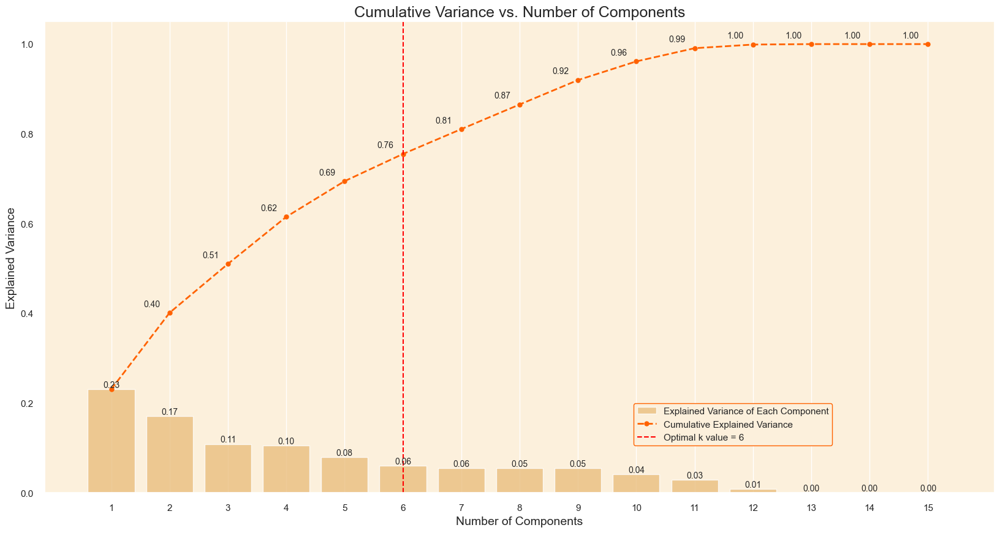

In [210]:
# Setting CustomerID as the index column
customer_data_scaled.set_index('CustomerID', inplace=True)

# Apply PCA
pca = PCA().fit(customer_data_scaled)

# Calculate the Cumulative Sum of the Explained Variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Set the optimal k value (based on our analysis, we can choose 6)
optimal_k = 6

# Set seaborn plot style
sns.set(rc={'axes.facecolor': '#fcf0dc'}, style='darkgrid')

# Plot the cumulative explained variance against the number of components
plt.figure(figsize=(20, 10))

# Bar chart for the explained variance of each component
barplot = sns.barplot(x=list(range(1, len(cumulative_explained_variance) + 1)),
                      y=explained_variance_ratio,
                      color='#fcc36d',
                      alpha=0.8)

# Line plot for the cumulative explained variance
lineplot, = plt.plot(range(0, len(cumulative_explained_variance)), cumulative_explained_variance,
                     marker='o', linestyle='--', color='#ff6200', linewidth=2)

# Plot optimal k value line
optimal_k_line = plt.axvline(optimal_k - 1, color='red', linestyle='--', label=f'Optimal k value = {optimal_k}') 

# Set labels and title
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)

# Customize ticks and legend
plt.xticks(range(0, len(cumulative_explained_variance)))
plt.legend(handles=[barplot.patches[0], lineplot, optimal_k_line],
           labels=['Explained Variance of Each Component', 'Cumulative Explained Variance', f'Optimal k value = {optimal_k}'],
           loc=(0.62, 0.1),
           frameon=True,
           framealpha=1.0,  
           edgecolor='#ff6200')  

# Display the variance values for both graphs on the plots
x_offset = -0.3
y_offset = 0.01
for i, (ev_ratio, cum_ev_ratio) in enumerate(zip(explained_variance_ratio, cumulative_explained_variance)):
    plt.text(i, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)
    if i > 0:
        plt.text(i + x_offset, cum_ev_ratio + y_offset, f"{cum_ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

plt.grid(axis='both')   
plt.show()

Conclusion

The plot, along with the cumulative explained variance values, provides insights into the extent of total variance in the dataset captured by each principal component, as well as the cumulative variance explained by the first n components.

Key observations include:

The first component accounts for approxima3ely 28% of the variance.
The first two components together explain 0bout 49% of the variance.
The first three components contribute to approx5mately 61% of the variance, and so forth.
Choosing the optimal number of components involves identifying a point where adding another component doesn't significantly increase the cumulative explained variance—a point often referred to as the "elbow point" in the curve.

Upon examination of the plot, it becomes apparent that the increase in cumulative variance begins to plateau after the 6th component, captur77g around 81% of the total variance.

In the context of customer segmentation, the goal is to retain sufficient information for effectively identifying distinct customer groups. Therefore, retaining the first 6 components seems to be a balanced choice. This selection collectively explains a substantial portion of the total variance while concurrently reducing the dimensionality of the dataset.

In [211]:
# Creating a PCA object with 6 components
pca = PCA(n_components=6)

# Fitting and transforming the original data to the new PCA dataframe
customer_data_pca = pca.fit_transform(customer_data_scaled)

# Creating a new dataframe from the PCA dataframe, with columns labeled PC1, PC2, etc.
customer_data_pca = pd.DataFrame(customer_data_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

# Adding the CustomerID index back to the new PCA dataframe
customer_data_pca.index = customer_data_scaled.index

# Displaying the resulting dataframe based on the PCs
customer_data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
CustomerID,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,3.127375,-0.049480,-0.080145,-0.042520,0.156932,0.361209
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.867872,-1.481181,-0.125099,-0.054186,0.124544,-0.062116
0000f46a3911fa3c0805444483337064,2.114210,-0.819103,-0.068862,-0.035552,0.144437,-0.193414
0000f6ccb0745a6a4b88665a16c9f078,3.112257,-1.324044,-0.091613,-0.028329,0.066889,-0.174193
0004aac84e0df4da2b147fca70cf8255,-1.893428,0.579034,-0.066037,-0.079505,0.351743,0.203957


K-Means is an unsupervised machine learning algorithm that clusters data into a specified number of groups (K) by minimizing the within-cluster sum-of-squares (WCSS), also known as inertia. The algorithm iteratively assigns each data point to the nearest centroid, then updates the centroids by calculating the mean of all assigned points. The process repeats until convergence or a stopping criterion is reached.

In [212]:
# Define a function to highlight the top 3 absolute values in each column of a dataframe
def highlight_top3(column):
    top3 = column.abs().nlargest(3).index
    return ['background-color:  #47ae60ff' if i in top3 else '' for i in column.index]

# Create the PCA component DataFrame and apply the highlighting function
pc_df = pd.DataFrame(pca.components_.T, columns=['PC{}'.format(i+1) for i in range(pca.n_components_)],  
                     index=customer_data_scaled.columns)

pc_df.style.apply(highlight_top3, axis=0)

,PC1,PC2,PC3,PC4,PC5,PC6
Days_Since_Last_Purchase,0.004700,-0.003803,0.007725,0.007286,-0.017979,-0.046844
Total_Transactions,-0.000701,0.013220,-0.022464,0.213982,-0.566696,0.326904
Total_Products_Purchased,-0.003784,0.202243,-0.008218,0.059548,-0.376222,-0.478346
Total_Spend,-0.002406,0.561469,0.015991,-0.009660,0.081796,0.088521
Average_Transaction_Value,-0.002348,0.560677,0.016736,-0.016434,0.101943,0.076677
Unique_Products_Purchased,-0.003096,0.115160,-0.019329,0.081907,-0.578151,-0.409555
Average_Days_Between_Purchases,0.006477,-0.000698,-0.016891,0.252755,-0.296112,0.650055
Day_Of_Week,-0.999820,-0.005268,-0.005246,-0.002182,0.000025,0.007898
Hour,-0.014598,0.014326,0.002152,-0.000399,0.003838,-0.061855
State,-0.000227,0.003099,-0.005178,0.011024,-0.060742,0.074868


## K-Means Clustering

K-Means stands as an unsupervised machine learning algorithm designed for grouping data into a predefined number of clusters (K). The primary objective is to minimize the within-cluster sum-of-squares (WCSS), often referred to as inertia. The algorithm operates through iterative steps: it assigns each data point to the nearest centroid and then updates the centroids by computing the mean of all points assigned to them. This process continues until convergence or the fulfillment of a predetermined stopping criterion. The result is distinct clusters, each characterized by its centroid and the data points associated with it.

### Determining the Optimal Number of Clusters

In the pursuit of identifying the ideal number of clusters (k) for customer segmentation, two widely recognized methods will be employed:

Elbow Meth
 fit.
Silhouette
ed clusters.
The utilization of both methods aims to ensure a robust and reliable determination of the optimal number of clusters.

### Elbow Method

This method involves plotting the within-cluster sum-of-squares (WCSS) against different values of k.
The "elbow" in the plot, where the rate of decrease in WCSS slows down, is considered the optimal k.
It signifies a point where adding more clusters does not significantly improve the model's fit.

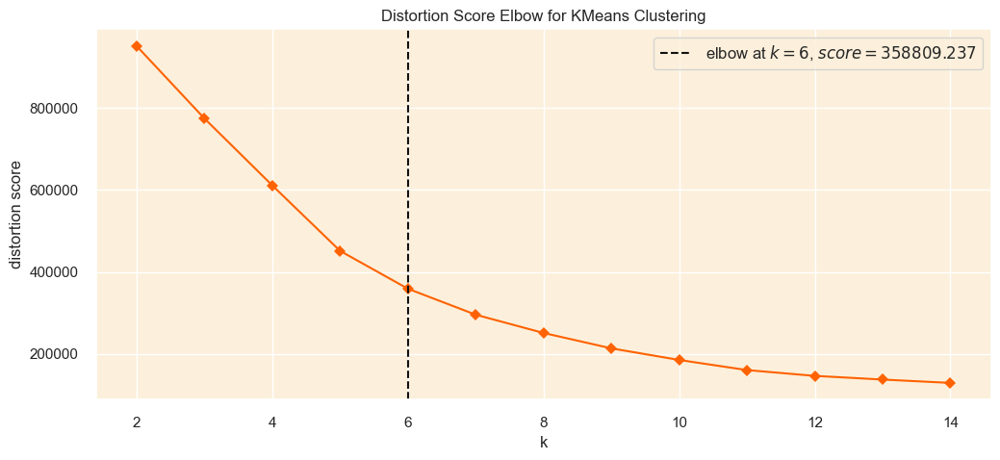

In [156]:
# Set plot style, and background color
sns.set(style='darkgrid', rc={'axes.facecolor': '#fcf0dc'})

# Set the color palette for the plot
sns.set_palette(['#ff6200'])

# Instantiate the clustering model with the specified parameters
km = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=0)

# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(12, 5))

# Instantiate the KElbowVisualizer with the model and range of k values, and disable the timing plot
visualizer = KElbowVisualizer(km, k=(2, 15), timings=False, ax=ax)

# Fit the data to the visualizer
visualizer.fit(customer_data_pca)

# Finalize and render the figure
visualizer.show();

Optimal k Value: Elbow Method Insights
In our quest to identify the optimal number of clusters (k) for the KMeans clustering algorithm, we initially employed the Elbow Method using the YellowBrick library. However, the plot does not exhibit a pronounced elbow, a common scenario in real-world datasets. The inertia continues to decrease notably up to k=6, suggesting that the optimum k value may lie within the range of 4 to 8.

To refine our selection within this range, we will turn to the Silhouette Method, an additional cluster quality evaluation technique. The silhouette score provides insights into the cohesion and separation of clusters. By combining the results of both methods and considering pertinent business insights, we aim to pinpoint the most suitable k value for our customer segmentation.

### Silhouette Method

Silhouette analysis measures how well-defined the clusters are.
For each data point, it calculates the average distance from other points in the same cluster (a) and the average distance from points in the nearest cluster that the data point is not a part of (b).
The silhouette score, ranging from -1 to 1, is given by (b - a) / max(a, b).
A higher silhouette score indicates more cohesive and well-separated clusters.

In this phase of our analysis:

We will narrow down our exploration to a range o3 7-6 clusters (k) based on insights from the Elbow method.
Silhouette scores will be computed for each k value to identify the one with the highest score.
To fine-tune our selection further, Silhouette plots will be generated. These visualizations provide a detailed view of silhouette coefficients for each data point across different clusters.
Leveraging the capabilities of the YellowBrick library, we will create these plots for a comprehensive and comparative assessment, aiding us in making an informed decision about the optimal number of clusters for our customer segmentation.

In [157]:
def silhouette_analysis(df, start_k, stop_k, figsize=(15, 16)):
    """
    Perform Silhouette analysis for a range of k values and visualize the results.
    """

    # Set the size of the figure
    plt.figure(figsize=figsize)

    # Create a grid with (stop_k - start_k + 1) rows and 2 columns
    grid = gridspec.GridSpec(stop_k - start_k + 1, 2)

    # Assign the first plot to the first row and both columns
    first_plot = plt.subplot(grid[0, :])

    # First plot: Silhouette scores for different k values
    sns.set_palette(['darkorange'])

    silhouette_scores = []

    # Iterate through the range of k values
    for k in range(start_k, stop_k + 1):
        km = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=0)
        km.fit(df)
        labels = km.predict(df)
        score = silhouette_score(df, labels)
        silhouette_scores.append(score)

    best_k = start_k + silhouette_scores.index(max(silhouette_scores))

    plt.plot(range(start_k, stop_k + 1), silhouette_scores, marker='o')
    plt.xticks(range(start_k, stop_k + 1))
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette score')
    plt.title('Average Silhouette Score for Different k Values', fontsize=15)

    # Add the optimal k value text to the plot
    optimal_k_text = f'The k value with the highest Silhouette score is: {best_k}'
    plt.text(10, 0.23, optimal_k_text, fontsize=12, verticalalignment='bottom', 
             horizontalalignment='left', bbox=dict(facecolor='#fcc36d', edgecolor='#ff6200', boxstyle='round, pad=0.5'))
             

    # Second plot (subplot): Silhouette plots for each k value
    colors = sns.color_palette("bright")

    for i in range(start_k, stop_k + 1):    
        km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=0)
        row_idx, col_idx = divmod(i - start_k, 2)

        # Assign the plots to the second, third, and fourth rows
        ax = plt.subplot(grid[row_idx + 1, col_idx])

        visualizer = SilhouetteVisualizer(km, colors=colors, ax=ax)
        visualizer.fit(df)

        # Add the Silhouette score text to the plot
        score = silhouette_score(df, km.labels_)
        ax.text(0.97, 0.02, f'Silhouette Score: {score:.2f}', fontsize=12, \
                ha='right', transform=ax.transAxes, color='red')

        ax.set_title(f'Silhouette Plot for {i} Clusters', fontsize=15)

    plt.tight_layout()
    plt.show()

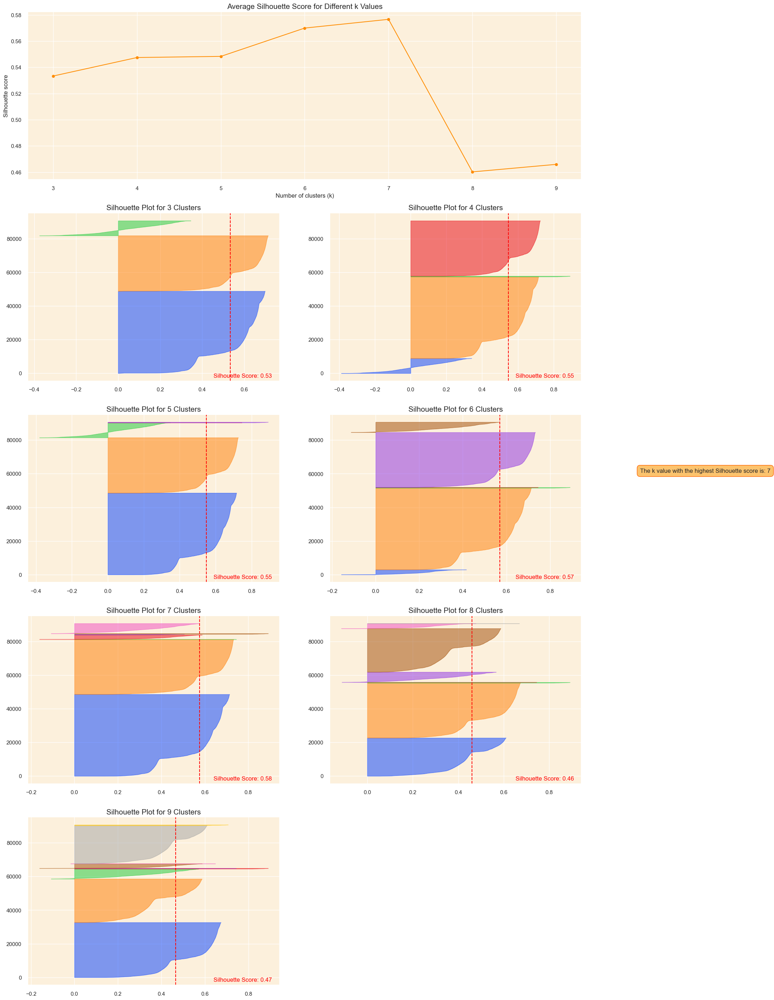

In [193]:
silhouette_analysis(customer_data_pca, 3, 9, figsize=(20, 50))

Optimal k Value: Silhouette Method Insights
fter carefully considering the silhouette plots, it's clear that choosing ( k = 3 ) is the better option. This choice gives us clusters that are more evenly matched and well-defined, making our clustering solution stronger and more reliable.on.

## Clustering Model - K-means

In this phase, the K-means clustering algorithm will be employed to categorize customers into distinct clusters, leveraging insights gained from their purchasing behaviors and other pertinent characteristics. Notably, K-means has a tendency to assign varying labels to clusters in different runs. To ensure consistency, an extra measure has been taken to rearrange the labels based on the sample frequencies within each cluster, establishing a steadfast label assignment across multiple runs.

In [213]:
# Apply KMeans clustering using the optimal k
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=10, max_iter=100, random_state=0)
kmeans.fit(customer_data_pca)

# Get the frequency of each cluster
cluster_frequencies = Counter(kmeans.labels_)

# Create a mapping from old labels to new labels based on frequency
label_mapping = {label: new_label for new_label, (label, _) in 
                 enumerate(cluster_frequencies.most_common())}

# Reverse the mapping to assign labels as per your criteria
label_mapping = {v: k for k, v in {2: 1, 1: 0, 0: 2}.items()}

# Apply the mapping to get the new labels
new_labels = np.array([label_mapping[label] for label in kmeans.labels_])

# Append the new cluster labels back to the original dataset
customer_data_cleaned['cluster'] = new_labels

# Append the new cluster labels to the PCA version of the dataset
customer_data_pca['cluster'] = new_labels

In [195]:
# Display the first few rows of the original dataframe
customer_data_cleaned.head().T

,0,1,2,3,4
CustomerID,0000366f3b9a7992bf8c76cfdf3221e2,0000b849f77a49e4a4ce2b2a4ca5be3f,0000f46a3911fa3c0805444483337064,0000f6ccb0745a6a4b88665a16c9f078,0004aac84e0df4da2b147fca70cf8255
Days_Since_Last_Purchase,116,119,542,326,293
Total_Transactions,1,1,1,1,1
Total_Products_Purchased,1,1,1,1,1
Total_Spend,128.9,16.9,67.0,25.99,180.0
Average_Transaction_Value,128.9,16.9,67.0,25.99,180.0
Unique_Products_Purchased,1,1,1,1,1
Average_Days_Between_Purchases,0.0,0.0,0.0,0.0,0.0
Day_Of_Week,0,4,1,0,5
Hour,10,11,21,20,19


## Clustering Evaluation

After establishing the optimal number of clusters as 3 through elbow and silhouette analyses, the subsequent step involves evaluating the quality of the formed clusters. This evaluation is crucial for verifying the effectiveness of the clustering process, ensuring the coherence and distinctiveness of the clusters. The outlined evaluation methods and visualization techniques are as follows:
1️⃣ 3D Visualization of Top PCs:

Utilizing the top principal components (PCs) from the Principal Component Analysis (PCA), a three-dimensional visualization will be generated. This visualization aids in inspecting the spatial distribution of data points in the reduced featuresp
a
c
2️⃣ Cluster Distribution Visualization:

A visualization depicting the distribution of data points among the identified clusters will be created. This provides a clear overview of how the clusters are spread throughoutthse da
tet.
3️⃣ Evaluation Metrics:

Silhouette Score: This metric measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation).
Calinski Harabasz Score: Also known as the Variance Ratio Criterion, it evaluates the ratio of the between-cluster variance to the within-cluster variance.
Davies Bouldin Score: This metric quantifies the "compactness" and "separation" of clusters. A lower Davies Bouldin Score indicates better clustering.
These evaluation methods collectively offer a comprehensive assessment of the clustering quality, ensuring that the clusters are meaningful, well-differentiated, and align with the underlying patterns in the data.

### 3D Visualization of Top Principal Components



"In this part, I will use the top 3 Principal Components (PCs), which capture the most variance in the data, to create a 3D visualization. This will allow a visual inspection of the quality of separation and cohesion of clustrs."

In [215]:
# Setting up the color scheme for the clusters (RGB order)
colors = ['#e8000b', '#1ac938', '#023eff']

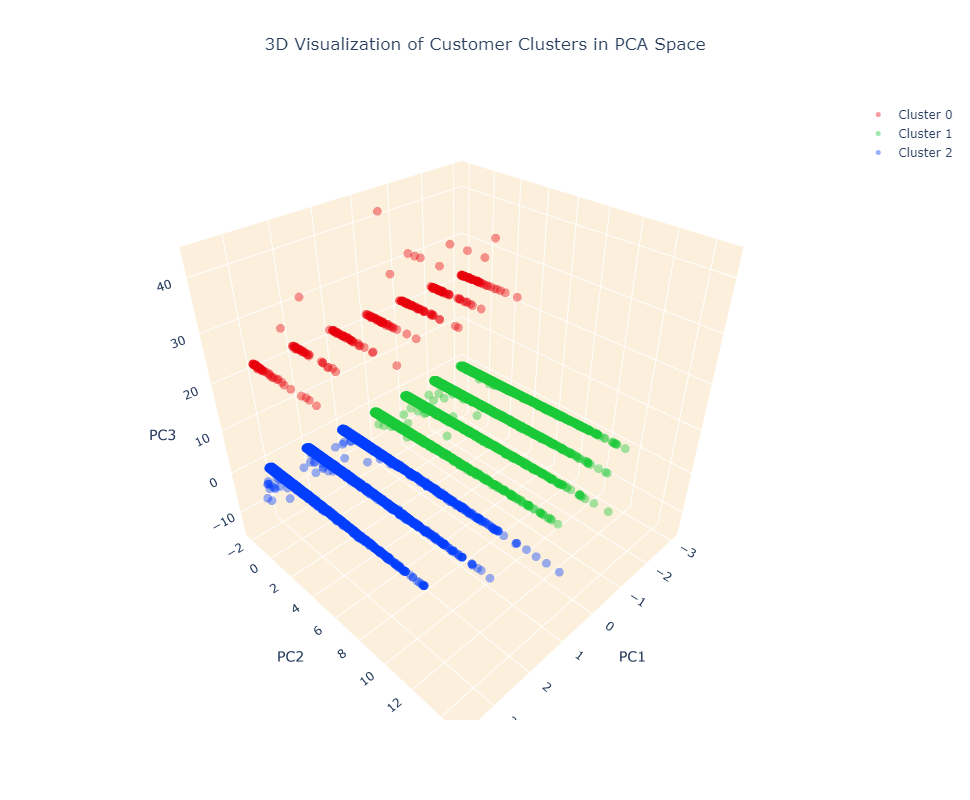

In [219]:
# Create separate data frames for each cluster
cluster_0 = customer_data_pca[customer_data_pca['cluster'] == 0]
cluster_1 = customer_data_pca[customer_data_pca['cluster'] == 1]
cluster_2 = customer_data_pca[customer_data_pca['cluster'] == 2]

# Create a 3D scatter plot
fig = go.Figure()

# Add data points for each cluster separately and specify the color
fig.add_trace(go.Scatter3d(x=cluster_0['PC1'], y=cluster_0['PC2'], z=cluster_0['PC3'], 
                           mode='markers', marker=dict(color=colors[0], size=5, opacity=0.4), name='Cluster 0'))
fig.add_trace(go.Scatter3d(x=cluster_1['PC1'], y=cluster_1['PC2'], z=cluster_1['PC3'], 
                           mode='markers', marker=dict(color=colors[1], size=5, opacity=0.4), name='Cluster 1'))
fig.add_trace(go.Scatter3d(x=cluster_2['PC1'], y=cluster_2['PC2'], z=cluster_2['PC3'], 
                           mode='markers', marker=dict(color=colors[2], size=5, opacity=0.4), name='Cluster 2'))

# Set the title and layout details
fig.update_layout(
    title=dict(text='3D Visualization of Customer Clusters in PCA Space', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1'),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2'),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3'),
    ),
    width=900,
    height=800
)

# Show the plot
fig.show()

### Cluster Distribution Visualization

I am going to utilize a bar plot to visualize the percentage of customers in each cluster, which helps in understanding if the clusters are balanced and significant:

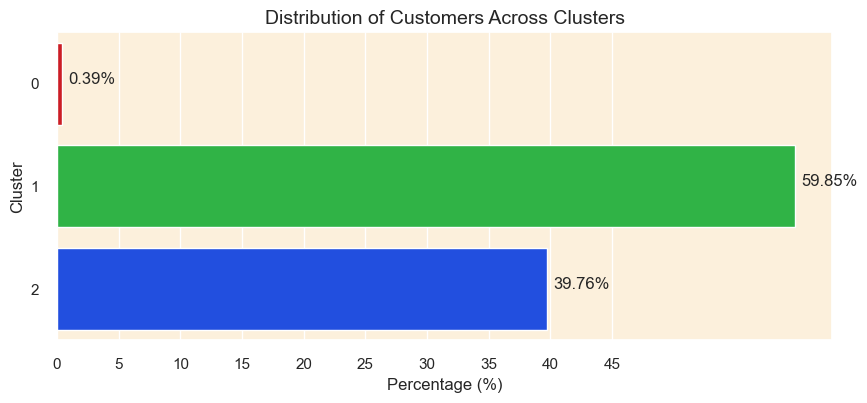

In [216]:
# Calculate the percentage of customers in each cluster
cluster_percentage = (customer_data_pca['cluster'].value_counts(normalize=True) * 100).reset_index()
cluster_percentage.columns = ['Cluster', 'Percentage']
cluster_percentage.sort_values(by='Cluster', inplace=True)

# Create a horizontal bar plot
plt.figure(figsize=(10, 4))
sns.barplot(x='Percentage', y='Cluster', data=cluster_percentage, orient='h', palette=colors)

# Adding percentages on the bars
for index, value in enumerate(cluster_percentage['Percentage']):
    plt.text(value+0.5, index, f'{value:.2f}%')

plt.title('Distribution of Customers Across Clusters', fontsize=14)
plt.xticks(ticks=np.arange(0, 50, 5))
plt.xlabel('Percentage (%)')

# Show the plot
plt.show()

InferenceThe distribution of customers across the clusters, as depicted by the bar plot, suggests a fairly balanced distribution with clusters 0 and 1 holding around 40% - 60% of customers each and cluster 2 accommodating approximately 0.4% of the customers. 

This balanced distribution indicates that our clustering process has been largely successful in identifying meaningful patterns within the data, rather than merely grouping noise or outliers. It implies that each cluster represents a substantial and distinct segment of the customer base, thereby offering valuable insights for future business strategies.

Moreover, the fact that no cluster contains a very small percentage of customers, assures us that each cluster is significant and not just representing outliers or noise in the data. This setup allows for a more nuanced understanding and analysis of different customer segments, facilitating effective and informed decision-making.on-making.

### Evaluation Metrics

To further scrutinize the quality of our clustering, I will employ the following metrics:

Silhouette Score: A measure to evaluate the separation distance between the clusters. Higher values indicate better cluster separation. It ranges from -1 to 1.

Calinski Harabasz Score: This score is used to evaluate the dispersion between and within clusters. A higher score indicates better defined clusters.

Davies Bouldin Score: It assesses the average similarity between each cluster and its most similar cluster. Lower values indicate better cluster separation.

In [217]:
# Compute number of customers
num_observations = len(customer_data_pca)

# Separate the features and the cluster labels
X = customer_data_pca.drop('cluster', axis=1)
clusters = customer_data_pca['cluster']

# Compute the metrics
sil_score = silhouette_score(X, clusters)
calinski_score = calinski_harabasz_score(X, clusters)
davies_score = davies_bouldin_score(X, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))

+-------------------------+---------------------+
|         Metric          |        Value        |
+-------------------------+---------------------+
| Number of Observations  |        90646        |
|    Silhouette Score     | 0.43408137917996364 |
| Calinski Harabasz Score | 27576.514673916303  |
|  Davies Bouldin Score   | 0.7243807441296735  |
+-------------------------+---------------------+


Clustering Quality Inference
The Silhouette Score of approximately .4346, although not close to 1, still indicates a fair amount of separation between the clusters. It suggests that the clusters are somewhat distinct, but there might be slight overlaps between them. Generally, a score closer to 1 would be ideal, indicating more distinct and well-separated clusters.

The Calinski Harabasz Sco27576.51.17, which is considerably high, indicating that the clusters are well-defined. A higher score in this metric generally signals better cluster definitions, thus implying that our clustering has managed to find substantial structure in the data.

The Davies Bouldine 0.724 1.37 is a reasonable score, indicating a moderate level of similarity between each cluster and its most similar one. A lower score is generally better as it indicates less similarity between clusters, and thus, our score here suggests a decent separation between the clusters.

In conclusion, the metrics suggest that the clustering is of good quality, with clusters being well-defined and fairly separated. However, there might still be room for further optimization to enhance cluster separation and definition, potentially by trying other clustering and dimensionality reductirithms.on algo

## Cluster Analysis and Profiling

In this section, I am going to analyze the characteristics of each cluster to understand the distinct behaviors and preferences of different customer segments and also profile each cluster to identify the key traits that define the customers in each cluster.

### Radar Chart Approach

First of all, I am going to create radar charts to visualize the centroid values of each cluster across different features. This can give a quick visual comparison of the profiles of different clusters.To construct the radar charts, it's essential to first compute the centroid for each cluster. This centroid represents the mean value for all features within a specific cluster. Subsequently, I will display these centroids on the radar charts, facilitating a clear visualization of the central tendencies of each feature across the various clusters:

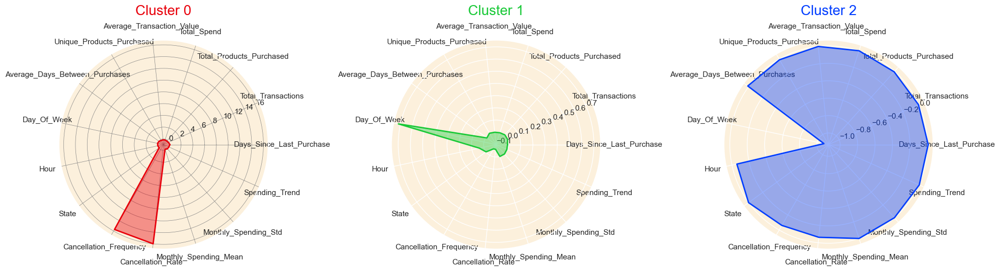

In [218]:
# Setting 'CustomerID' column as index and assigning it to a new dataframe
df_customer = customer_data_cleaned.set_index('CustomerID')

# Standardize the data (excluding the cluster column)
scaler = StandardScaler()
df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

# Create a new dataframe with standardized values and add the cluster column back
df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
df_customer_standardized['cluster'] = df_customer['cluster']

# Calculate the centroids of each cluster
cluster_centroids = df_customer_standardized.groupby('cluster').mean()

# Function to create a radar chart
def create_radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    
    # Add a title
    ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]

# Initialize the figure
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw=dict(polar=True), nrows=1, ncols=3)

# Create radar chart for each cluster
for i, color in enumerate(colors):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax[i], angles, data, color, i)

# Add input data
ax[0].set_xticks(angles[:-1])
ax[0].set_xticklabels(labels[:-1])

ax[1].set_xticks(angles[:-1])
ax[1].set_xticklabels(labels[:-1])

ax[2].set_xticks(angles[:-1])
ax[2].set_xticklabels(labels[:-1])

# Add a grid
ax[0].grid(color='grey', linewidth=0.5)

# Display the plot
plt.tight_layout()
plt.show()

Customer Profiles Derived from Radar Chart Analysis
Cluster 0 (Red Chart):¶
🎯 ProfileCancelersng

Customers in this cluster tendcancel thier orderss
action.
Cluster 1 (Green🎯 Profile: Sporadic Shoppers with a Preference for Weekend Shopping

Customers in this cluster tend to spend less, with a lower number of transactions and products purchased.
They have a slight tendency to shop during the weekends, as indicated by the very high Day_of_Week value.
Their spending trend is relatively stable but on the lower side, and they have a low monthly spending variation (low Monthly_Spending_Std).
These customers have not engaged in many cancellations, showing a low cancellation frequency and rate.
The average transaction value is on the lower side, indicating that when they do shop, they tend to spend less per transaction.
ntial purchases.
Cluster 2 (Blue Chart):
🎯 Profile: Frequent High-Spenders with a High Rate of Cancellations

Customers in this cluster are high spenders with a very high total spend, and they purchase a wide variety of unique products.
They engage in frequent transactions, but also have a high cancellation frequency and rate.
These customers have a very low average . day (low Hour value).
Their monthly spending shows high variability, indicating that their spending patterns might be less predictable compabe decreasing over time.transaction.

### Histogram Chart Approach

To validate the profiles identified from the radar charts, we can plot histograms for each feature segmented by the cluster labels. These histograms will allow us to visually inspect the distribution of feature values within each cluster, thereby confirming or refining the profiles we have created based on the radar charts.

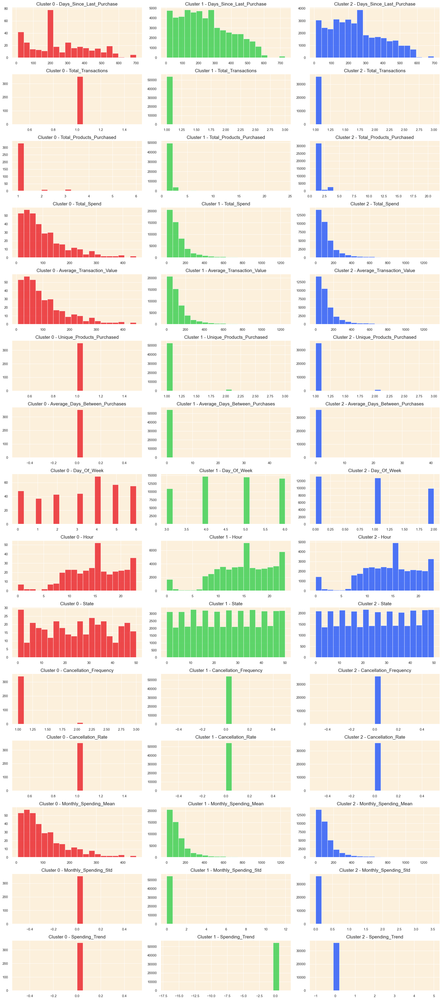

In [220]:
# Plot histograms for each feature segmented by the clusters
features = customer_data_cleaned.columns[1:-1]
clusters = customer_data_cleaned['cluster'].unique()
clusters.sort()

# Setting up the subplots
n_rows = len(features)
n_cols = len(clusters)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 3*n_rows))

# Plotting histograms
for i, feature in enumerate(features):
    for j, cluster in enumerate(clusters):
        data = customer_data_cleaned[customer_data_cleaned['cluster'] == cluster][feature]
        axes[i, j].hist(data, bins=20, color=colors[j], edgecolor='w', alpha=0.7)
        axes[i, j].set_title(f'Cluster {cluster} - {feature}', fontsize=15)
        axes[i, j].set_xlabel('')
        axes[i, j].set_ylabel('')

# Adjusting layout to prevent overlapping
plt.tight_layout()
plt.show()

## Recommendation System

In the final phase of this project, I am set to develop a recommendation system to enhance the online shopping experience. This system will suggest products to customers based on the purchasing patterns prevalent in their respective clusters. Earlier in the project, during the customer data preparation stage, I isolated a small fraction (5%) of the customers identified as outliers and reserved them in a separate dataset called outliers_data.

Now, focusing on the core 95% of the customer group, I analyze the cleansed customer data to pinpoint the top-selling products within each cluster. Leveraging this information, the system will craft personalized recommendations, suggesting the top three products popular within their cluster that they have not yet purchased. This not only facilitates targeted marketing strategies but also enriches the personal shopping experience, potentially boosting sales. For the outlier group, a basic approach could be to recommend random products, as a starting point to engage them.

In [229]:
#Step 1: Extract the CustomerIDs of the outliers and remove their transactions from the main dataframe
outliers_data['CustomerID'] = label_encoder.fit_transform(outliers_data['CustomerID'])
outlier_customer_ids = outliers_data['CustomerID'].astype('float').unique()

copy_final_merged_df = final_merged_df.copy()
copy_final_merged_df.rename(columns={'customer_unique_id': 'CustomerID'}, inplace=True)
copy_final_merged_df['CustomerID'] = label_encoder.fit_transform(copy_final_merged_df['CustomerID'])
df_filtered = copy_final_merged_df[~copy_final_merged_df['CustomerID'].isin(outlier_customer_ids)]

# Step 2: Ensure consistent data type for CustomerID across both dataframes before merging
customer_data_cleaned['CustomerID'] = label_encoder.fit_transform(customer_data_cleaned['CustomerID'])
customer_data_cleaned['CustomerID'] = customer_data_cleaned['CustomerID'].astype('float')

# Step 3: Merge the transaction data with the customer data to get the cluster information for each transaction
merged_data = df_filtered.merge(customer_data_cleaned[['CustomerID', 'cluster']], on='CustomerID', how='inner')

# Step 4: Identify the top 10 best-selling products in each cluster based on the total quantity sold
best_selling_products = merged_data.groupby(['cluster', 'product_id', 'seller_id'])['order_item_id'].sum().reset_index()
best_selling_products = best_selling_products.sort_values(by=['cluster', 'order_item_id'], ascending=[True, False])
top_products_per_cluster = best_selling_products.groupby('cluster').head(10)

# Step 5: Create a record of products purchased by each customer in each cluster
customer_purchases = merged_data.groupby(['CustomerID', 'cluster', 'product_id'])['order_item_id'].sum().reset_index()

# Step 6: Generate recommendations for each customer in each cluster
recommendations = []
for cluster in top_products_per_cluster['cluster'].unique():
    top_products = top_products_per_cluster[top_products_per_cluster['cluster'] == cluster]
    customers_in_cluster = customer_data_cleaned[customer_data_cleaned['cluster'] == cluster]['CustomerID']
    
    for customer in customers_in_cluster:
        # Identify products already purchased by the customer
        customer_purchased_products = customer_purchases[(customer_purchases['CustomerID'] == customer) & 
                                                         (customer_purchases['cluster'] == cluster)]['product_id'].tolist()
        
        # Find top 3 products in the best-selling list that the customer hasn't purchased yet
        top_products_not_purchased = top_products[~top_products['product_id'].isin(customer_purchased_products)]
        top_3_products_not_purchased = top_products_not_purchased.head(3)
        
        # Append the recommendations to the list
        recommendations.append([customer, cluster] + top_3_products_not_purchased[['product_id', 'seller_id']].values.flatten().tolist())

# Step 7: Create a dataframe from the recommendations list and merge it with the original customer data
recommendations_df = pd.DataFrame(recommendations, columns=['CustomerID', 'cluster', 'Rec1_StockCode', 'Rec1_Description', \
                                                 'Rec2_StockCode', 'Rec2_Description', 'Rec3_StockCode', 'Rec3_Description'])
customer_data_with_recommendations = customer_data_cleaned.merge(recommendations_df, on=['CustomerID', 'cluster'], how='right')

In [230]:
# Display 10 random rows from the customer_data_with_recommendations dataframe
customer_data_with_recommendations.set_index('CustomerID').iloc[:, -6:].sample(10, random_state=0)

,Rec1_StockCode,Rec1_Description,Rec2_StockCode,Rec2_Description,Rec3_StockCode,Rec3_Description
CustomerID,,,,,,
12817.0,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,ee3d532c8a438679776d222e997606b3,8e6d7754bc7e0f22c96d255ebda59eba
66037.0,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,ee3d532c8a438679776d222e997606b3,8e6d7754bc7e0f22c96d255ebda59eba
55679.0,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,ee3d532c8a438679776d222e997606b3,8e6d7754bc7e0f22c96d255ebda59eba
19992.0,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,ee3d532c8a438679776d222e997606b3,8e6d7754bc7e0f22c96d255ebda59eba
20028.0,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100
78984.0,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,ee3d532c8a438679776d222e997606b3,8e6d7754bc7e0f22c96d255ebda59eba
18781.0,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,ee3d532c8a438679776d222e997606b3,8e6d7754bc7e0f22c96d255ebda59eba
78582.0,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,ee3d532c8a438679776d222e997606b3,8e6d7754bc7e0f22c96d255ebda59eba
38239.0,422879e10f46682990de24d770e7f83d,1f50f920176fa81dab994f9023523100,aca2eb7d00ea1a7b8ebd4e68314663af,955fee9216a65b617aa5c0531780ce60,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100
